In [1]:

import os
import json
import glob
import copy
import numpy as np
import pylab as pl
import seaborn as sns
import pandas as pd
import itertools

from scipy import stats as spstats

from pipeline.python.classifications import experiment_classes as util
from pipeline.python.utils import natural_keys, label_figure

/home/julianarhee/Repositories/2p-pipeline/pipeline/python/classifications/experiment_classes.py:18: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

The backend was *originally* set to 'module://ipykernel.pylab.backend_inline' by the following code:
  File "/home/julianarhee/anaconda2/envs/pipeline/lib/python2.7/runpy.py", line 174, in _run_module_as_main
    "__main__", fname, loader, pkg_name)
  File "/home/julianarhee/anaconda2/envs/pipeline/lib/python2.7/runpy.py", line 72, in _run_code
    exec code in run_globals
  File "/home/julianarhee/anaconda2/envs/pipeline/lib/python2.7/site-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/home/julianarhee/anaconda2/envs/pipeline/lib/python2.7/site-packages/traitlets/config/application.py", line 658, in launch_instance
   

In [2]:
%matplotlib notebook

# Test blobs

In [3]:
rootdir = '/n/coxfs01/2p-data'
animalid = 'JC084' #'JC059'
session = '20190522' #'20190227'
fov = 'FOV1_zoom2p0x' #'FOV4_zoom4p0x'
traceid = 'traces001' #'traces001'
response_type = 'dff'


# Set responsivity params

In [4]:
responsive_test = 'nstds'
responsive_thr = 10.
n_stds = 2.5


# Get all blob data

In [5]:
from pipeline.python.classifications import get_dataset_stats as gd
import cPickle as pkl

options = ['-t', 'traces001']
optsE = gd.extract_options(options)

rootdir = optsE.rootdir
aggregate_dir = optsE.aggregate_dir
fov_type = optsE.fov_type
traceid = optsE.traceid
response_type = 'dff'
print aggregate_dir

/n/coxfs01/julianarhee/aggregate-visual-areas


/home/julianarhee/Repositories/2p-pipeline/pipeline/python/classifications/get_dataset_stats.py:17: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

The backend was *originally* set to u'nbAgg' by the following code:
  File "/home/julianarhee/anaconda2/envs/pipeline/lib/python2.7/runpy.py", line 174, in _run_module_as_main
    "__main__", fname, loader, pkg_name)
  File "/home/julianarhee/anaconda2/envs/pipeline/lib/python2.7/runpy.py", line 72, in _run_code
    exec code in run_globals
  File "/home/julianarhee/anaconda2/envs/pipeline/lib/python2.7/site-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/home/julianarhee/anaconda2/envs/pipeline/lib/python2.7/site-packages/traitlets/config/application.py", line 658, in launch_instance
    app.start()
  File "/home/juliana

In [6]:
sdata_fpath = os.path.join(aggregate_dir, 'dataset_info.pkl')
if os.path.exists(sdata_fpath):
    with open(sdata_fpath, 'rb') as f:
        sdata = pkl.load(f)
else:
    sdata = gd.aggregate_session_info(traceid=optsE.traceid, trace_type=optsE.trace_type, 
                                       state=optsE.state, fov_type=optsE.fov_type, 
                                       visual_areas=optsE.visual_areas,
                                       blacklist=optsE.blacklist, 
                                       rootdir=optsE.rootdir)
    with open(sdata_fpath, 'wb') as f:
        pkl.dump(sdata, f, protocol=pkl.HIGHEST_PROTOCOL)

In [7]:
experiment_type = 'blobs'
dsets = sdata[sdata['experiment']==experiment_type]

In [8]:
stats_desc = util.get_stats_desc(traceid=optsE.traceid,
                                      trace_type= optsE.trace_type,
                                      response_type = response_type,
                                      responsive_test = responsive_test,
                                      responsive_thr = responsive_thr,
                                      n_stds = n_stds)
print(stats_desc)

stats-traces001-corrected-dff-nstds-thr-10.00


# Create output dir for aggregated data

In [9]:
outdir = os.path.join(aggregate_dir, '%s-tuning' % experiment_type, stats_desc, 'functional-classes')
if not os.path.exists(outdir):
    os.makedirs(outdir)
print(outdir)

/n/coxfs01/julianarhee/aggregate-visual-areas/blobs-tuning/stats-traces001-corrected-dff-nstds-thr-10.00/functional-classes


In [10]:
dsets.head()

,animalid,experiment,fov,session,visual_area,exp_no,animal_no
2,JC084,blobs,FOV1_zoom2p0x,20190522,V1,0,4
6,JC084,blobs,FOV1_zoom2p0x,20190525,Lm,0,4
10,JC091,blobs,FOV1_zoom2p0x,20190627,Lm,0,7
14,JC091,blobs,FOV1_zoom2p0x,20190607,Li,0,7
18,JC091,blobs,FOV1_zoom2p0x,20190614,Li,0,7


# Create output dir for all session data

In [11]:
if not os.path.exists(os.path.join(outdir, 'sessions')):
    os.makedirs(os.path.join(outdir, 'sessions'))

# Out of the responsive cells, which are responsive to which condition?

In [12]:
from matplotlib.ticker import FormatStrFormatter


In [13]:
def reformat_morph_values(sdf):
    control_ixs = sdf[sdf['morphlevel']==-1].index.tolist()
    sizevals = np.array([round(s, 1) for s in sdf['size'].unique() if s not in ['None', None] and not np.isnan(s)] )
    sdf.loc[sdf.morphlevel==-1, 'size'] = pd.Series(sizevals, index=control_ixs)
    sdf['size'] = [round(s, 1) for s in sdf['size'].values]

    return sdf


## 1. Look at "tuning curves"

In [14]:
# Set plotting params
threshold_dff = True
min_dff = 0.03
cmap = 'inferno'
n_sz = 5
n_mp = 10

tune_name='morph'

incorrect_nvalues = []


In [15]:
#del exp

#### Plot tuning curve for each ROI

In [236]:
def plot_roi_tuning(df_mean, df_sem=None, tune_values=None, tune_name='', rois_plot=None,
                    hue_values=None, hue_name='', hue_colors=None, sharey=False):

    if rois_plot is None:
        rois_plot = df_mean.index.tolist()
    nrois_plot = len(rois_plot)
    
    
    print("N rois to plot: %i" % nrois_plot)
    nrows = int(round(np.sqrt(nrois_plot)))
    ncols = int(np.ceil(nrois_plot/float(nrows)))

    print(nrows, ncols)
    nsubplots = nrows*ncols

    vmin = df_mean.min().min()
    vmax = df_mean.max().max()

    fig, axes = pl.subplots(nrows, ncols, sharex=True, sharey=sharey, figsize=(ncols*3,nrows*3))
    fig.patch.set_alpha(1)
    if nrois_plot==1:
        axlist = [axes]
    elif nrows == 1:
        axlist = axes
    else:
        axlist = axes.flat

    for hv, hcolor in zip(hue_values, hue_colors):
        currcfgs = sdf[sdf[hue_name]==hv].index.tolist() #cols = [c for c in meanr.columns if 'S%i' % sz in c]
        for ai, roi in enumerate(curr_rois_list):
            ax = axlist[ai]
            #print hv, currcfgs, roi
            mean_vals = df_mean[currcfgs].loc[roi].values.astype(float)
            ax.plot(np.arange(0, len(tune_values)), mean_vals, color=hcolor) #[roi])

            if df_sem is not None:
                sem_vals = df_sem[currcfgs].loc[roi].values.astype(float)
                y1 = mean_vals + sem_vals
                y2 = mean_vals - sem_vals
                ax.fill_between(np.arange(0, len(tune_values)), y1, y2=y2, alpha=0.2, color=hcolor)

            ax.set_xticklabels(tune_values)
            ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
            ax.set_title(roi)
            

    label_figure(fig, data_id)
    if nrois_plot ==1:
        axlist[0].axis('off')
    else:
        for ax in axes.flat[nrois_plot:]:
            ax.axis('off')
    pl.subplots_adjust(wspace=0.8, hspace=0.8)

    return fig

# Look at 1 dataset to test

In [22]:
data_id = '|'.join([animalid, session, fov, traceid, stats_desc])

exp = util.Objects(animalid, session, fov, traceid=traceid, rootdir=rootdir)
# Get stimulus conditions
sdf = exp.get_stimuli()
sdf = reformat_morph_values(sdf)
sizes = np.array(sorted(sdf['size'].unique()))
morphs = np.array(sorted(sdf['morphlevel'].unique()))

n_sizes = len(sdf['size'].unique())
n_morphs = len(sdf['morphlevel'].unique()) 
if n_sizes != n_sz or n_morphs != n_mp:
    incorrect_nvalues.append(skey)
    pass

rstats, rlist, _ = util.get_roi_stats(animalid, session, fov, exp_name=exp.name,
                             response_type=response_type, responsive_test=responsive_test,
                             responsive_thr=responsive_thr, n_stds=n_stds)
rstats = rstats['nframes_above']

# Get metrics for each condition
estats = exp.get_stats(responsive_test=responsive_test, responsive_thr=responsive_thr, n_stds=n_stds)
meanr = pd.concat([pd.Series(estats.gdf.get_group(roi).groupby(['config']).mean()['dff'], name=roi) \
                   for roi in estats.rois], axis=1).T

# Get ROI list
if threshold_dff:
    rois_plot = meanr[(meanr.max(axis=1) > min_dff)].index.tolist()
else:
    rois_plot = meanr.index.tolist()
print("Plotting %i of %i responsive cells." % (len(rois_plot), len(meanr.index.tolist())))

semr = pd.concat([pd.Series(estats.gdf.get_group(roi).groupby(['config']).sem()['dff'], name=roi) \
                   for roi in estats.rois], axis=1).T


... [JC084|20190522|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
... renaming experiment to run name: combined_blobs_static
Getting stimulus info for: combined_blobs_static
... loading ROI stats: nstds
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
/n/coxfs01/2p-data/JC084/20190522/FOV1_zoom2p0x/combined_blobs_static/traces/traces001_ea0b53_traces001_92d492_traces001_af4cfd_traces001_9188fa_traces001_b44714_traces001_133108/data_arrays/np_subtracted.npz
adding NP offset...
... updating self
filtering responsive cells: nstds
... getting responsive cells (test: nstds, thr: 10.00')
Plotting 168 of 180 responsive cells.


### Plot average tuning curves

In [167]:
df_mean = meanr.loc[rois_plot]
df_sem = semr.loc[rois_plot]


In [168]:
colormap='coolwarm'

hue_param = 'morphlevel'

transform_param = 'size' if hue_param=='morphlevel' else 'morphlevel'
transform_values = sorted(sdf[transform_param].unique())
hue_values =  sorted(sdf[hue_param].unique())

#hcolors = sns.color_palette('RdBu', n_colors=n_sz) if tune_name=='morphlevel' else sns.color_palette('gray_r', n_colors=n_mp) 

hue_colors = sns.color_palette(colormap, n_colors=len(hue_values))
if hue_param == 'morphlevel':
    hue_colors[0] = (0, 0, 0)
    new_colors = sns.color_palette(colormap, n_colors=len(hue_values)-1)
    hue_colors[1:] = new_colors
    

In [25]:
visual_area = 'V1'

N rois to plot: 168
(13, 13)


<IPython.core.display.Javascript object>


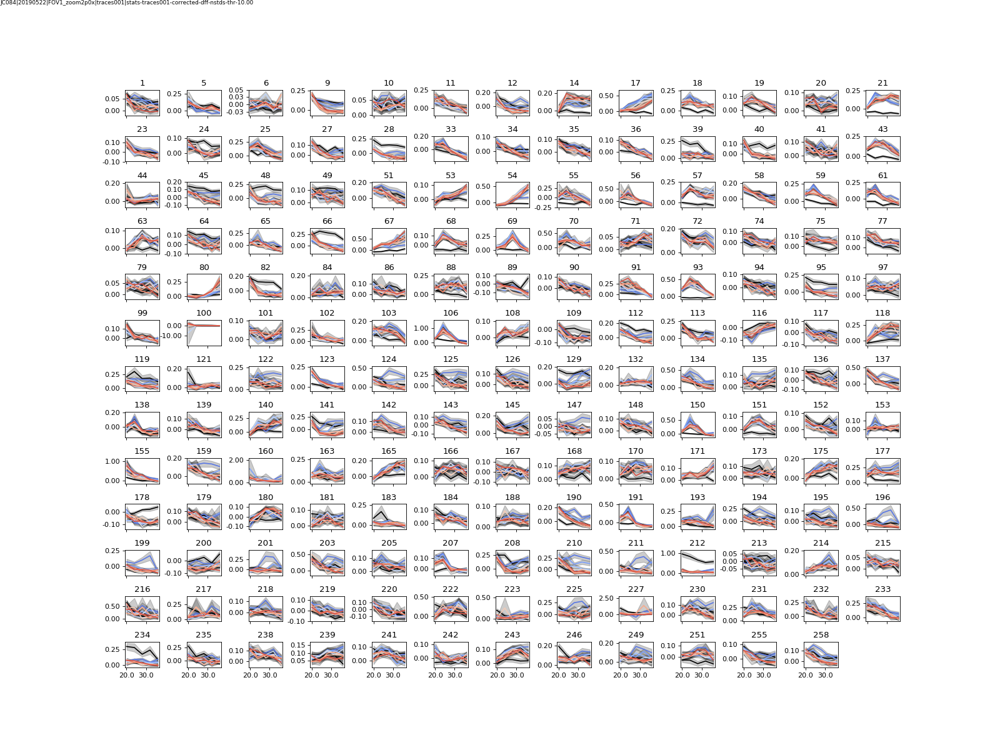

size-tuning-colormorphlevel_V1__JC084_20190522_FOV1_zoom2p0x_traces001_stats-traces001-corrected-dff-nstds-thr-10.00_thr-dff-0.03_168-of-180rois


In [210]:
sharey=False

fig = plot_roi_tuning(df_mean, df_sem=df_sem, tune_values=transform_values, tune_name=transform_param,
                     hue_values=hue_values, hue_name=hue_param, hue_colors=hue_colors, sharey=sharey)
# if threshold_dff:
#     figname = '%s-tuning_%s__%s_thr-dff-%.2f_%irois' % (tune_name, visual_area, data_id.replace('|', '_'), min_dff, len(rois_plot))
# else:
#     figname = '%s-tuning_%s__%s_all-resp_%irois' % (tune_name, visual_area, data_id.replace('|', '_'), len(rois_plot))

figname = '%s-tuning-color%s_%s__%s' % (transform_param, hue_param, visual_area, data_id.replace('|', '_'))

if threshold_dff:
    figname = '%s_thr-dff-%.2f_%i-of-%irois' % (figname, min_dff, len(rois_plot), len(estats.rois))
else:
    figname = '%s_all-resp_%i-of-%irois' % (figname, len(rois_plot), len(estats.rois))

if sharey:
    figname = '%s_sharey' % figname
    
pl.savefig(os.path.join(outdir, 'sessions', '%s.png' % figname))
print figname

# Dim reduction

In [26]:
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

from sklearn.preprocessing import StandardScaler
#from time import time
import time
import copy

# Get M x N matrix:
N = num cells * num trials for 1 conditions
M = num configs

In [27]:
# data = pd.concat(estats.gdf.get_group(roi)[[response_type, 'config', 'trial']] for roi in rois_plot)
# data.shape
# data['cell'] = data.index.tolist()
# data = data.reset_index(drop=True)


In [28]:
# config_list = sorted(result['config'].unique())

#### Make N cells x N trials

In [34]:
# Create aggregate dataframe
dflist = [pd.DataFrame(estats.gdf.get_group(roi).sort_values(by='trial')['dff']).reset_index(drop=True) \
            for roi in rois_plot]
data = pd.concat(dflist, axis=1)
data.shape
data.columns = rois_plot
data.head()

# Get sample labels
trial_configs = np.array(estats.gdf.get_group(roi).sort_values(by='trial')['config'].values)
len(trial_configs)

1500

In [35]:
trial_configs[0:20]

array(['config032', 'config031', 'config021', 'config020', 'config003',
       'config043', 'config034', 'config005', 'config012', 'config009',
       'config033', 'config008', 'config042', 'config044', 'config015',
       'config017', 'config023', 'config013', 'config006', 'config024'], dtype=object)

In [36]:
print data.shape

(1500, 168)


# Reduce

In [37]:
print data.shape

(1500, 168)


In [38]:
control_cfgs = sdf[sdf['color']!=''].index.tolist()
control_cfgs
image_cfgs = [c for c in sdf.index.tolist() if c not in control_cfgs]

In [39]:
ncells = len(rois_plot)

In [40]:
# curr_roi_list = [17, 54, 39, 43, 56, 59, 61, 67, 69, 80, 91, 93, 82, 99, 100, 106, 118, 119, 121, 123, 125, 129, 
#                 137, 141, 150, 145, 155, 165, 175, 177, 183, 190, 191, 193, 196, 199, 207, 212, 234, 239]

curr_roi_list = copy.copy(rois_plot)

In [41]:
features_are_cells = True
images_only = False

if images_only:
    X = data[image_cfgs]
else:
    X = data.copy() #.iloc[ixs]
    #X = df.copy()
    
#labels = X.index.tolist() # label cell, reduce config-space

labels = trial_configs.copy() ##exp.data.labels.groupby(['trial'])['config']
label_types = sorted(np.unique(labels))

print data.shape
print X.shape
print len(label_types)
print len(labels)

(1500, 168)
(1500, 168)
50
1500


In [42]:
data.shape

(1500, 168)

In [43]:
X_s = StandardScaler().fit_transform(X)

df = pd.DataFrame(X_s, index=X.index, columns=X.columns)

In [44]:
df.head()

,1,5,6,9,10,11,12,14,17,18,...,238,239,241,242,243,246,249,251,255,258
0,3.095665,-0.547518,0.392614,4.453685,1.382079,7.062967,4.001744,1.487275,1.222325,6.712107,...,2.731612,0.751110,5.437745,2.091994,0.634433,4.905218,5.085859,0.941639,0.959338,12.334324
1,3.748320,-0.374979,-0.093133,3.628266,0.739877,-0.983034,2.716727,-0.985067,-0.392969,1.355908,...,-0.930999,-0.563578,0.025056,-0.101546,-0.091094,-0.051893,-0.861606,0.748608,0.114917,0.026048
2,2.642036,-0.247135,-1.365805,1.469513,2.091305,-0.529819,0.733379,-0.616484,-0.282132,-0.646732,...,-0.740353,0.308422,0.674514,1.089083,-1.062376,1.554262,0.915870,1.913808,0.172961,0.837809
3,0.357442,-0.315171,-0.383060,0.059517,0.634101,-0.397911,-0.973077,-0.051963,3.162799,0.805085,...,1.078150,1.726510,1.179054,1.944290,2.125266,5.733413,0.685533,-0.346751,-0.847972,0.843673
4,0.700301,-0.474765,1.324004,0.234321,-0.550983,-1.070412,-1.020852,0.046455,-0.708524,-0.496223,...,1.205062,-0.198028,0.189482,0.543483,-0.344775,1.548486,-0.614141,-0.835209,0.016592,-1.897893


<IPython.core.display.Javascript object>


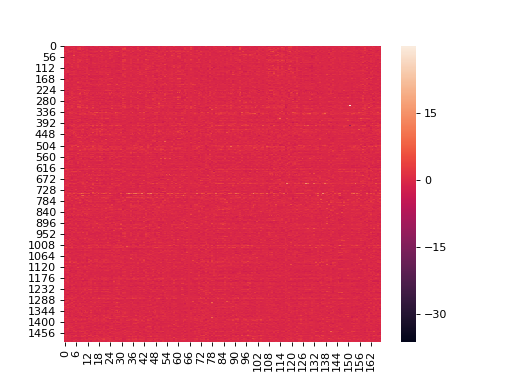

In [49]:
pl.figure()
sns.heatmap(X_s)

# PCA / LDA

#### colorbars

In [56]:
from matplotlib.colors import LinearSegmentedColormap, ListedColormap, BoundaryNorm
import matplotlib.cm as cm

def create_color_bar(fig, hue_colors, hue_values, hue_param='label', orientation='horizontal', cbar_axes=[0.58, 0.17, 0.3, 0.02]):

    cmap = ListedColormap(hue_colors)
    bounds = np.arange(0, len(hue_values))
    norm = BoundaryNorm(bounds, cmap.N)
    mappable = cm.ScalarMappable(cmap=cmap)
    mappable.set_array(bounds)

    cbar_ax = fig.add_axes(cbar_axes)
    cbar = fig.colorbar(mappable, cax=cbar_ax, boundaries=np.arange(-0.5,len(hue_values),1), \
                        ticks=bounds, norm=norm, orientation='horizontal')
    cbar.ax.tick_params(axis='both', which='both',length=0)
    cbar.ax.set_xticklabels(hue_values, fontsize=6) #(['%i' % i for i in morphlevels])  # horizontal colorbar
    cbar.ax.set_xlabel(hue_param, fontsize=10)

    return cbar

In [45]:
X_s.shape

(1500, 168)

In [47]:
n_components = X_s.shape[1] #50
lda = LinearDiscriminantAnalysis(n_components=n_components)
pca = PCA(n_components=n_components)
X_pca = pca.fit(X_s, labels).transform(X_s)
X_lda = lda.fit(X_s, labels).transform(X_s)
cvar_pca = np.cumsum(pca.explained_variance_ratio_)
cvar_lda = np.cumsum(lda.explained_variance_ratio_)


<IPython.core.display.Javascript object>


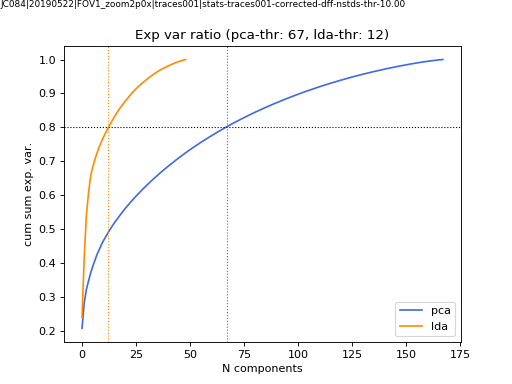

In [48]:
color1='royalblue'
color2='darkorange'
comp_thr=0.8

fig = pl.figure()
pl.plot(cvar_pca, label='pca', color=color1)
pl.plot( cvar_lda, label='lda', color=color2)
pl.legend()

pl.xlabel("N components")
pl.ylabel('cum sum exp. var.')
label_figure(fig, data_id)

pl.axhline(y=comp_thr, color='k', linestyle=':', lw=1)

ncomp_thr1 = int(np.where(np.abs(cvar_pca-comp_thr)==np.min(np.abs(cvar_pca-comp_thr)))[0])
ncomp_thr2 =int( np.where(np.abs(cvar_lda-comp_thr)==np.min(np.abs(cvar_lda-comp_thr)))[0])
pl.axvline(x=ncomp_thr1, color=color1, linestyle=':', lw=1)
pl.axvline(x=ncomp_thr2, color=color2, linestyle=':', lw=1)

pl.title("Exp var ratio (pca-thr: %i, lda-thr: %i)" % (ncomp_thr1, ncomp_thr2))

pl.savefig(os.path.join(outdir, 'explained_variance_lda_vs_pca.png'))

# DImensionality Reduction

In [76]:
n_components= ncomp_thr2
dimr_type = 'LDA'

if dimr_type == 'LDA':
    dimr = LinearDiscriminantAnalysis(n_components=n_components, store_covariance=True)
else:
    dimr = PCA(n_components=n_components)
    
X_r = dimr.fit(X_s, labels).transform(X_s)
# Percentage of variance explained for each components
print('Explained variation per principal component: {}'.format(dimr.explained_variance_ratio_))
print('Total explained variance {}: {}'.format( n_components, np.sum(dimr.explained_variance_ratio_)))


print X_r.shape
print df.shape

orig_columns = data.columns.tolist()
for ni in range(n_components):
    df['%s-%i' % (dimr_type, int(ni))] = X_r[:, ni]
    

Explained variation per principal component: [ 0.23978371  0.17531403  0.1231949   0.06732841  0.05180147  0.02628166
  0.02270013  0.01875699  0.01740202  0.01521473  0.01442053  0.01283884]
Total explained variance 12: 0.7850374164
(1500, 12)
(1500, 185)


In [77]:
df['config'] = [int(t[-3:]) for t in trial_configs]
df['size'] = [sdf['size'][t] for t in trial_configs]
df['morphlevel'] = [sdf['morphlevel'][t] for t in trial_configs]


In [78]:
outdir

'/n/coxfs01/julianarhee/aggregate-visual-areas/blobs-tuning/stats-traces001-corrected-dff-nstds-thr-10.00/functional-classes'

In [79]:
%matplotlib notebook

####  Plot all PW combinations of components

In [80]:
all_pws = list(itertools.combinations(range(n_components), 2))
len(all_pws)

66

In [81]:
nr=6
nc=11


<IPython.core.display.Javascript object>


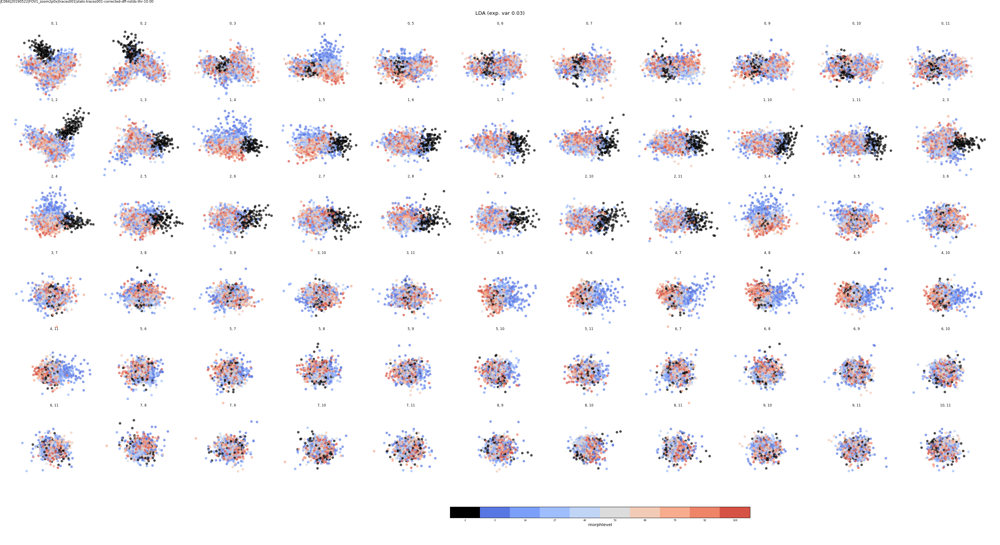

all-pws-12-components_LDA-reduce-cells_sample-trials_label-morphlevel


In [57]:
feature_type = 'cells'
sample_type = 'trials'
color_by = 'morphlevel'
#colors = sns.color_palette("hls", len(df[color_by].unique()))

valuelist = sorted(sdf[color_by].unique())
if color_by=='size':
    colormap_name = 'cubehelix'
    colorlist = sns.color_palette(colormap_name, len(df[color_by].unique()))
else:
    colormap_name = 'coolwarm'
    colorlist = sns.color_palette(colormap_name, len(df[color_by].unique())+1)
    colorlist[0] = (0, 0, 0)
    new_colors = sns.color_palette(colormap_name, n_colors=len(df[color_by].unique())-1)
    colorlist[1:] = new_colors
    
df['param_ix'] = [list(sorted(sdf[color_by].unique())).index(pv) for pv in df[color_by] ]
df['colors'] = [colorlist[i] for i in df['param_ix']]


all_pws = list(itertools.combinations(range(n_components), 2))

fig, axes = pl.subplots(nr, nc, figsize=(nc*3, nr*3), sharex=True, sharey=True)
fig.patch.set_alpha(1)
for ax, (d1, d2) in zip(axes.flat, all_pws):
    sns.scatterplot(
        x="%s-%i" % (dimr_type, d1), 
        y="%s-%i" % (dimr_type, d2),
        hue=color_by,
        palette=colorlist,
        data=df,
        legend=0, #"full",
        alpha=0.7,
        ax=ax,
        marker='o',
        linewidth=0.1
    )
    ax.set_title('%i, %i' % (d1, d2), fontsize=8)
    ax.set_ylabel('')
    ax.set_xlabel('')
    ax.axis('off')
pl.subplots_adjust(wspace=0.005, hspace=0.005, top=0.95, left=0.01, right=0.99)
fig.suptitle('%s (exp. var %.2f)' % (dimr_type, np.sum(dimr.explained_variance_ratio_[d1:d2+1])))
label_figure(fig, data_id)

cbar = create_color_bar(fig, colorlist, valuelist, cbar_axes=[0.45, 0.05, 0.3, 0.02],  hue_param=color_by)

figname = 'all-pws-%i-components_%s-reduce-%s_sample-%s_label-%s' % (n_components, dimr_type, feature_type, sample_type, color_by)
pl.savefig(os.path.join(outdir, '%s.png' % figname))

print figname

<IPython.core.display.Javascript object>


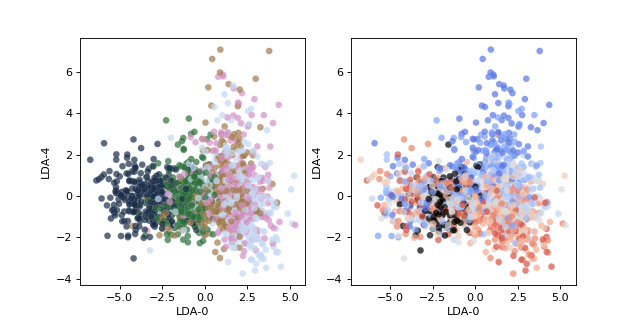

10


In [82]:
d1 = 0
d2 = 4

fig, axes= pl.subplots(1, 2, figsize=(8, 4))

color_by = 'size'
valuelist = sorted(sdf[color_by].unique())
if color_by=='size':
    colormap_name = 'cubehelix'
    colorlist = sns.color_palette(colormap_name, len(df[color_by].unique()))
else:
    colormap_name = 'coolwarm'
    colorlist = sns.color_palette(colormap_name, len(df[color_by].unique()))
    colorlist[0] = (0, 0, 0)
    new_colors = sns.color_palette(colormap_name, n_colors=len(df[color_by].unique())-1)
    colorlist[1:] = new_colors
    
sns.scatterplot(
        x="%s-%i" % (dimr_type, d1), 
        y="%s-%i" % (dimr_type, d2),
        hue=color_by,
        palette=colorlist,
        data=df,
        legend=0, #"full",
        alpha=0.7,
        ax=axes[0],
        marker='o',
        linewidth=0.1)

color_by='morphlevel'
valuelist = sorted(sdf[color_by].unique())
if color_by=='size':
    colormap_name = 'cubehelix'
    colorlist = sns.color_palette(colormap_name, len(df[color_by].unique()))
else:
    colormap_name = 'coolwarm'
    colorlist = sns.color_palette(colormap_name, len(df[color_by].unique()))
    colorlist[0] = (0, 0, 0)
    new_colors = sns.color_palette(colormap_name, n_colors=len(df[color_by].unique())-1)
    colorlist[1:] = new_colors
print len(colorlist)
    
sns.scatterplot(
        x="%s-%i" % (dimr_type, d1), 
        y="%s-%i" % (dimr_type, d2),
        hue=color_by,
        palette=colorlist,
        data=df,
        legend=0, #"full",
        alpha=0.7,
        ax=axes[1],
        marker='o',
        linewidth=0.1
    )

In [348]:
def myplot(score,coeff,labels=None):
    xs = score[:,0]
    ys = score[:,1]
    n = coeff.shape[0]
    print len(xs), len(ys), n

    pl.scatter(xs ,ys, c = labels) #without scaling
    for i in range(n):
        pl.arrow(0, 0, coeff[i,0], coeff[i,1],color = 'r',alpha = 0.5)
        if labels is None:
            pl.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, "Var"+str(i+1), color = 'g', ha = 'center', va = 'center')
        else:
            pl.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, labels[i], color = 'g', ha = 'center', va = 'center')


In [376]:
np.array(dimr.scalings_[:, d1]*1.5)

array([ -4.00269397e-04,  -3.38601624e-01,  -3.67342383e-02,
        -5.08579796e-01,   4.33694810e-02,   5.41241440e-02,
        -1.48039865e-02,   6.69605238e-02,   2.78869387e-01,
         5.38130099e-02,  -8.25242074e-02,   2.59198248e-01,
         2.73695338e-01,  -1.56783940e-01,  -1.51428790e-01,
        -1.03101441e-01,   1.33673804e-01,  -3.64778778e-01,
        -3.26291357e-01,  -1.54369373e-01,   7.30751028e-02,
        -3.18518610e-01,  -1.66924323e-03,  -2.10030384e-01,
         1.10515114e-02,   8.96257943e-02,   2.40182452e-02,
         1.77044249e-01,  -1.45922554e-01,  -1.91166183e-02,
        -2.59988743e-02,   7.31800373e-02,   7.39636267e-01,
         2.02519446e-01,  -4.85236625e-02,  -7.38367708e-02,
        -2.54336412e-02,  -2.41920239e-01,   2.50906327e-01,
         8.28612265e-02,  -5.23069417e-03,  -3.48250736e-02,
        -1.20766250e-01,  -8.71037769e-03,  -3.51458112e-01,
         3.39815095e-01,   2.77600807e-01,  -2.42789658e-02,
        -1.84865750e-02,

<IPython.core.display.Javascript object>


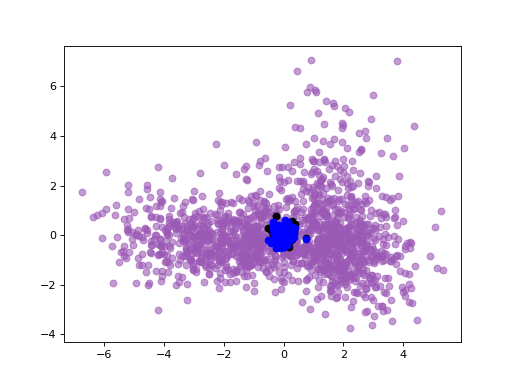

In [389]:
pl.figure()
pl.scatter(df[x].values, df[y].values, alpha=0.6) #without scaling

#for i in range(len(rois_plot)):
v1 = list(dimr.scalings_[:, d1]*1.5)
v2 = list(dimr.scalings_[:, d2]*1.5)
pl.scatter(v1, v2, c='k')


v3 = list(dimr.scalings_[:, 9]*1.5)
pl.scatter(v1, v3, c='b')

In [378]:
v1

array([ -4.00269397e-04,  -3.38601624e-01,  -3.67342383e-02,
        -5.08579796e-01,   4.33694810e-02,   5.41241440e-02,
        -1.48039865e-02,   6.69605238e-02,   2.78869387e-01,
         5.38130099e-02,  -8.25242074e-02,   2.59198248e-01,
         2.73695338e-01,  -1.56783940e-01,  -1.51428790e-01,
        -1.03101441e-01,   1.33673804e-01,  -3.64778778e-01,
        -3.26291357e-01,  -1.54369373e-01,   7.30751028e-02,
        -3.18518610e-01,  -1.66924323e-03,  -2.10030384e-01,
         1.10515114e-02,   8.96257943e-02,   2.40182452e-02,
         1.77044249e-01,  -1.45922554e-01,  -1.91166183e-02,
        -2.59988743e-02,   7.31800373e-02,   7.39636267e-01,
         2.02519446e-01,  -4.85236625e-02,  -7.38367708e-02,
        -2.54336412e-02,  -2.41920239e-01,   2.50906327e-01,
         8.28612265e-02,  -5.23069417e-03,  -3.48250736e-02,
        -1.20766250e-01,  -8.71037769e-03,  -3.51458112e-01,
         3.39815095e-01,   2.77600807e-01,  -2.42789658e-02,
        -1.84865750e-02,

<IPython.core.display.Javascript object>


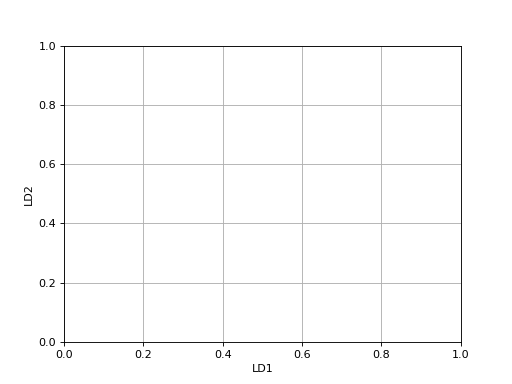

1500 1500 168


ValueError: c of shape (168,) not acceptable as a color sequence for x with size 1500, y with size 1500

In [356]:
pl.figure()
pl.xlabel("LD{}".format(1))
pl.ylabel("LD{}".format(2))
pl.grid()

#Call the function. 
myplot(df[[x, y]].values, dimr.scalings_, labels=np.array(rois_plot))


In [337]:
x="%s-%i" % (dimr_type, d1)
y="%s-%i" % (dimr_type, d2)
df[[x, y]]

,LDA-0,LDA-4
0,-0.781526,-1.047806
1,-3.108522,-1.004580
2,-3.225106,0.192474
3,1.281379,-0.514880
4,-1.312369,0.510410
5,1.227138,-1.183948
6,2.253861,1.229622
7,-1.605954,0.560950
8,-0.145450,1.067793
9,3.095442,2.397491


In [83]:
data.shape

(1500, 168)

In [84]:
X_r.shape

(1500, 12)

In [85]:
dimr.coef_.shape

(50, 168)

In [86]:
dimr.store_covariance

True

<IPython.core.display.Javascript object>


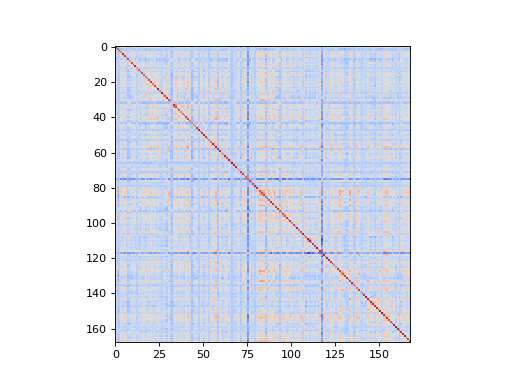

In [306]:
pl.figure()
pl.imshow(dimr.covariance_, cmap='coolwarm')

<IPython.core.display.Javascript object>


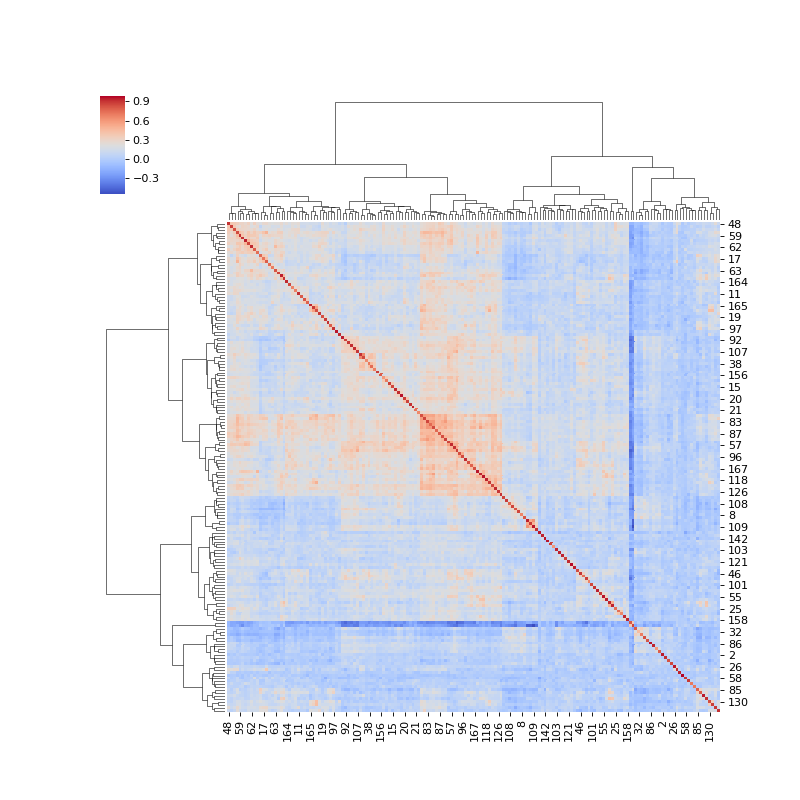

In [96]:
sns.clustermap(dimr.covariance_, method='ward', cmap='coolwarm')

In [98]:
rlist = [83, 87, 57, 96, 167, 118, 126]
[rois_plot[r] for r in rlist]

[125, 134, 88, 143, 258, 179, 193]

In [138]:
from scipy.spatial import distance
from scipy.cluster import hierarchy
from scipy.cluster.hierarchy import dendrogram, set_link_color_palette


In [139]:
cov = pd.DataFrame(data=dimr.covariance_, columns=rois_plot, index=rois_plot)
from fastcluster import linkage



ImportError: No module named fastcluster

<IPython.core.display.Javascript object>


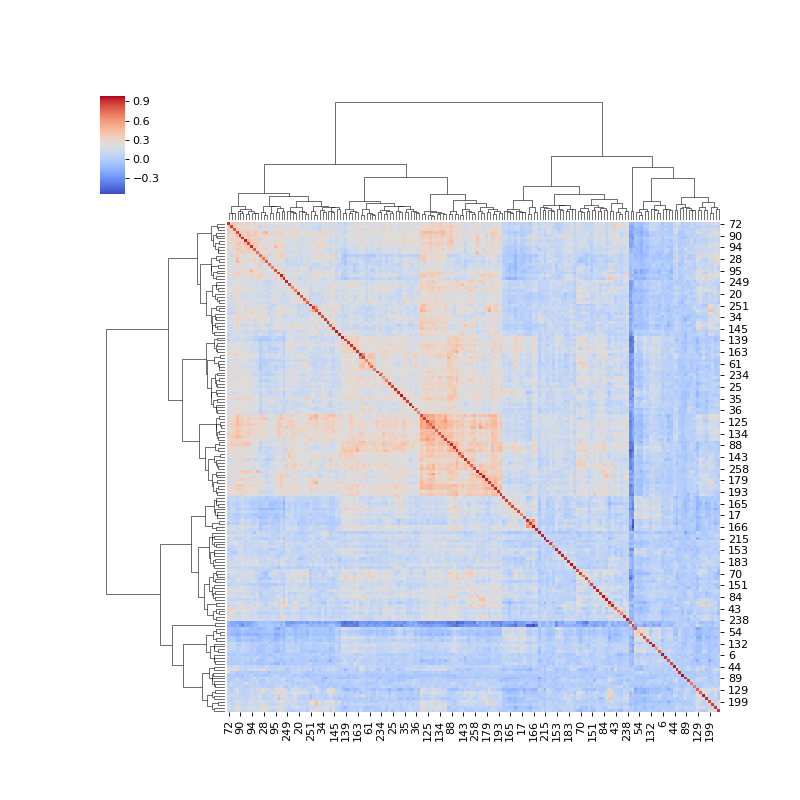

In [162]:

#row_linkage = hierarchy.linkage(distance.pdist(dimr.covariance_), method='ward')
#row_linkage = hierarchy.linkage(cov, method='ward')
row_linkage = hierarchy.linkage(cov, method='ward')

sns.clustermap(cov, row_linkage=row_linkage, col_linkage=row_linkage, method="ward",
               cmap='coolwarm')

In [275]:
row_linkage

array([[  90.        ,  133.        ,    0.56019564,    2.        ],
       [  83.        ,  168.        ,    0.60896686,    3.        ],
       [  95.        ,   96.        ,    0.63464234,    2.        ],
       [  33.        ,   34.        ,    0.6636793 ,    2.        ],
       [  32.        ,   43.        ,    0.66522765,    2.        ],
       [  17.        ,   28.        ,    0.70161133,    2.        ],
       [  18.        ,   37.        ,    0.71642365,    2.        ],
       [ 128.        ,  129.        ,    0.71677226,    2.        ],
       [ 110.        ,  119.        ,    0.73017055,    2.        ],
       [  41.        ,   57.        ,    0.73288029,    2.        ],
       [  60.        ,   61.        ,    0.75509143,    2.        ],
       [  24.        ,   40.        ,    0.78025509,    2.        ],
       [  73.        ,   87.        ,    0.78561372,    2.        ],
       [  82.        ,  127.        ,    0.79063079,    2.        ],
       [  70.        ,  100.      

In [480]:
color_thr=2
curr_cluster_dir = os.path.join(outdir, 'test-clusters', 'thr-%i' % color_thr)
if not os.path.exists(curr_cluster_dir):
    os.makedirs(curr_cluster_dir)

existing = glob.glob(os.path.join(curr_cluster_dir, '*.png'))
print "deleting %i files" % len(existing)
for f in existing:
    os.remove(f)
print glob.glob(os.path.join(curr_cluster_dir, '*.png'))

deleting 0 files
[]


<IPython.core.display.Javascript object>


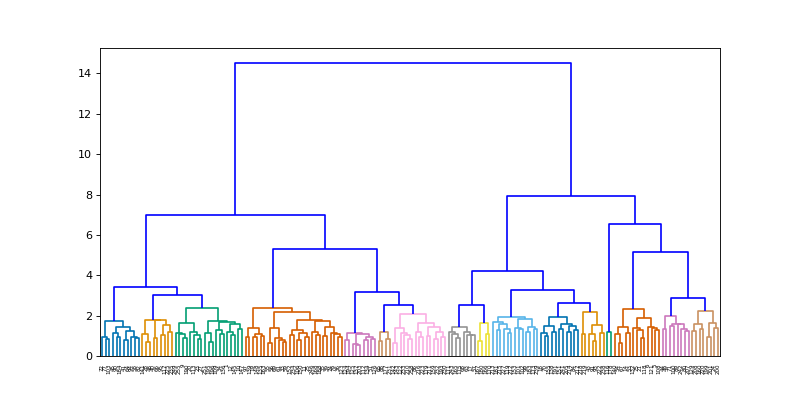

11


In [481]:
fig = pl.figure(figsize=(10,5))
#dn = hierarchy.dendrogram(row_linkage, labels=cov.index, abv_threshold_color='#AAAAAA')
dn = dendrogram(row_linkage, labels=cov.index, color_threshold=color_thr) #='#AAAAAA')
print len(np.unique(dn['color_list']))

In [468]:
list_ixs= []
unique_c=[]
last_c=None
for ci, c in enumerate(dn['color_list']):
    if c not in unique_c:
        unique_c.append(c)
    if c==last_c:
        continue
    else:
        if c in unique_c and ci!= 0:
            list_ixs.append(ci)
    last_c = c

In [469]:
unique_c

[u'#0173b2',
 u'#de8f05',
 u'#029e73',
 'b',
 u'#d55e00',
 u'#cc78bc',
 u'#ca9161',
 u'#fbafe4',
 u'#949494',
 u'#ece133',
 u'#56b4e9']

In [470]:
list_ixs

[10, 18, 36, 38, 64, 72, 90, 93, 104, 116, 133, 135, 136, 148, 163]

In [471]:
total_nclusters = len(list_ixs) + len(unique_c)
color_list = sns.color_palette('colorblind', n_colors=total_nclusters)
color_list= list(color_list.as_hex())
hierarchy.set_link_color_palette(color_list)


In [472]:
type(color_list)

list

In [461]:
from collections import defaultdict
from matplotlib.colors import rgb2hex, colorConverter

class Clusters(dict):
    def _repr_html_(self):
        html = '<table style="border: 0;">'
        for c in self:
            #hx=c
            if c=='b':
                hx = rgb2hex(colorConverter.to_rgb(c))
            else:
                hx= c
            html += '<tr style="border: 0;">' \
            '<td style="background-color: {0}; ' \
                       'border: 0;">' \
            '<code style="background-color: {0};">'.format(hx)
            html += c + '</code></td>'
            html += '<td style="border: 0"><code>' 
            html += repr(self[c]) + '</code>'
            html += '</td></tr>'

        html += '</table>'

        return html

    
def get_cluster_classes(den, label='ivl'):
    cluster_idxs = defaultdict(list)
    for c, pi in zip(den['color_list'], den['icoord']):
        for leg in pi[1:3]:
            i = (leg - 5.0) / 10.0
            if abs(i - int(i)) < 1e-5:
                cluster_idxs[c].append(int(i))

    cluster_classes = Clusters()
    for c, l in cluster_idxs.items():
        i_l = [den[label][i] for i in l]
        cluster_classes[c] = i_l

    return cluster_classes

In [475]:
cluster_classes = get_cluster_classes(dn)
cluster_classes

b,[132]
#ece133,"[70, 155, 18, 138, 191, 151, 241, 205, 214, 84, 217, 205, 218, 219, 91, 93, 43, 222, 238]"
#0173b2,"[77, 103, 72, 90, 184, 45, 41, 64, 58, 82, 94, 54, 67, 140, 14, 53, 21, 118, 75, 132, 5, 108, 121, 6]"
#d55e00,"[97, 139, 19, 148, 135, 163, 55, 56, 33, 59, 61, 69, 152, 234, 106, 150, 11, 25, 168, 188, 246, 35, 39, 36, 123, 79, 74, 106, 19]"
#029e73,"[9, 190, 255, 249, 23, 27, 113, 20, 195, 196, 251, 34, 136, 109, 12, 145, 1, 10, 147]"
#56b4e9,"[116, 178]"
#cc78bc,"[124, 194, 137, 203, 125, 112, 134, 51, 126]"
#949494,"[181, 215, 119, 212, 227, 213, 101, 102, 153, 99, 183, 173, 239]"
#fbafe4,"[165, 175, 243, 171, 17, 57, 63, 68, 167, 180, 166, 170]"
#de8f05,"[28, 48, 141, 40, 66, 95, 117, 225, 235, 95, 44, 49, 71, 100, 80, 207, 242, 89, 129, 208, 160, 220, 199, 201, 24, 200]"
#ca9161,"[65, 88, 177, 231, 142, 143, 210, 258, 233, 122, 216, 223, 86, 179, 211, 159, 232, 193, 230, 159]"


In [476]:
for k, v in cluster_classes.items():
    print k, len(v)


b 1
#ece133 19
#0173b2 24
#d55e00 29
#029e73 19
#56b4e9 2
#cc78bc 9
#949494 13
#fbafe4 12
#de8f05 26
#ca9161 20


N rois to plot: 1
(1, 1)


<IPython.core.display.Javascript object>


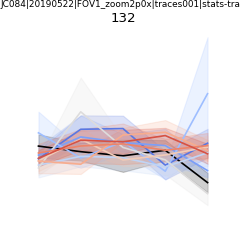

_c-b__size-tuning-colormorphlevel_V1__JC084_20190522_FOV1_zoom2p0x_traces001_stats-traces001-corrected-dff-nstds-thr-10.00_thr-dff-0.03_168-of-180rois
N rois to plot: 19
(4, 5)


<IPython.core.display.Javascript object>


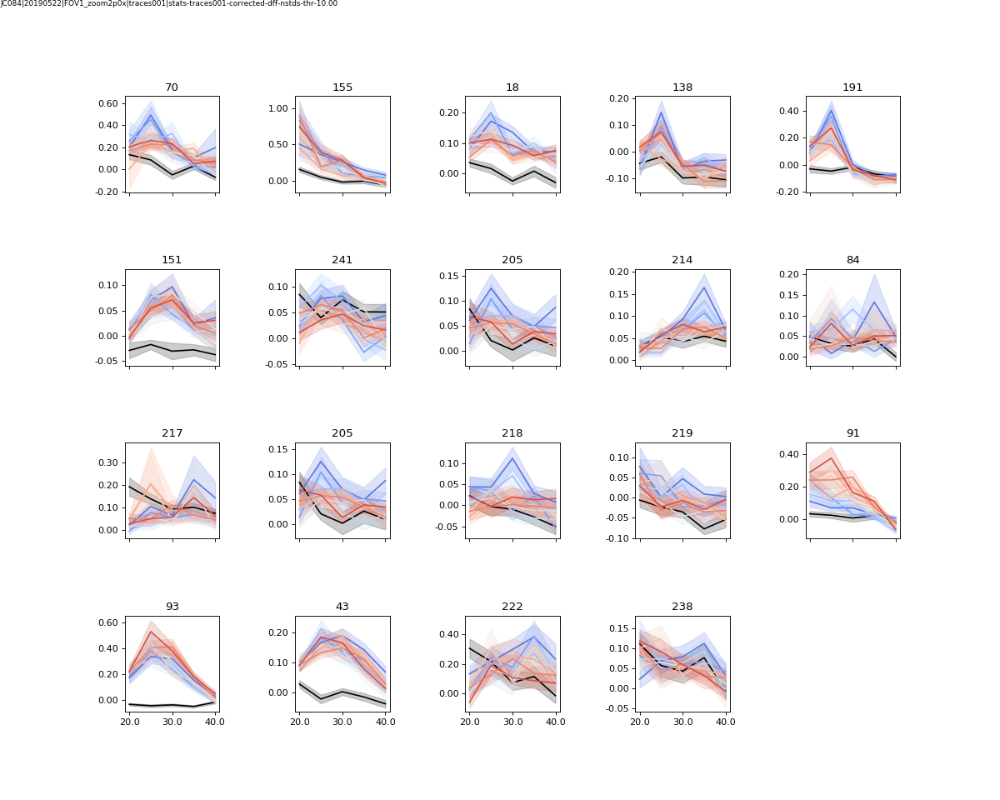

_c-#ece133__size-tuning-colormorphlevel_V1__JC084_20190522_FOV1_zoom2p0x_traces001_stats-traces001-corrected-dff-nstds-thr-10.00_thr-dff-0.03_168-of-180rois
N rois to plot: 24
(5, 5)


<IPython.core.display.Javascript object>


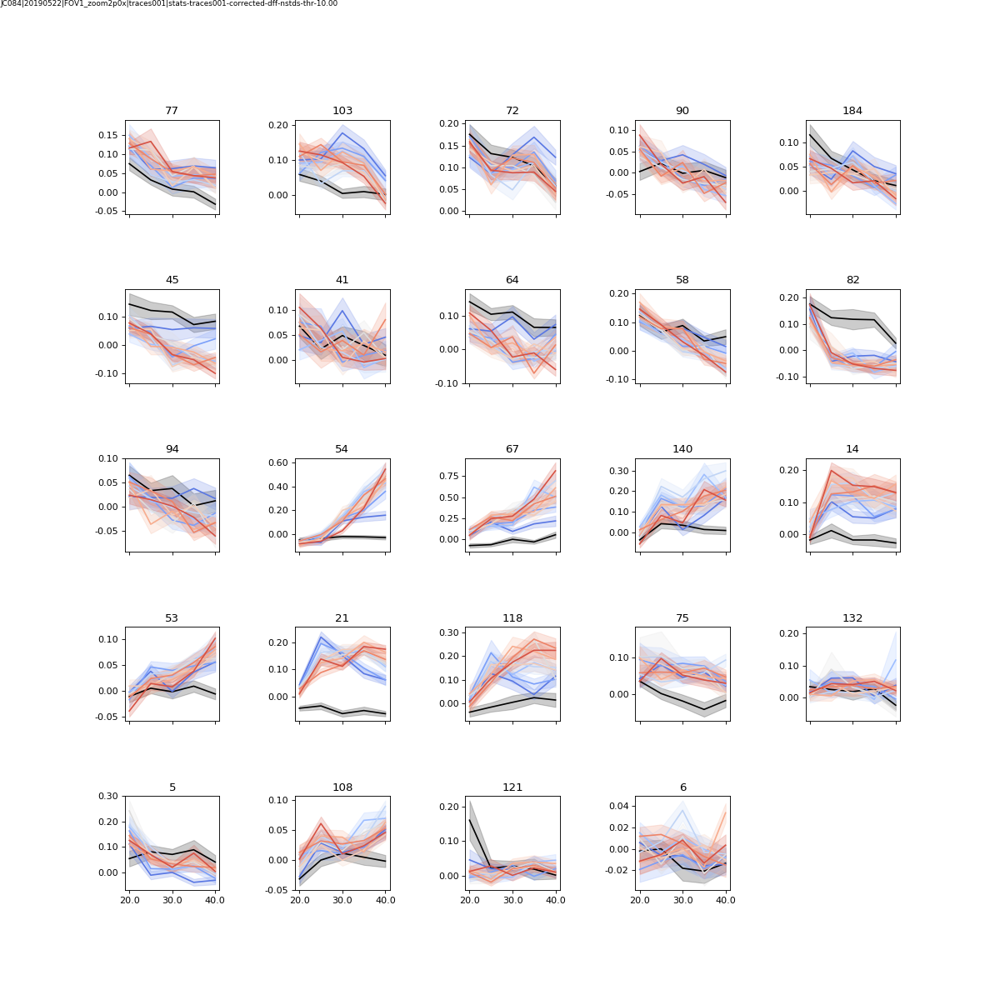

_c-#0173b2__size-tuning-colormorphlevel_V1__JC084_20190522_FOV1_zoom2p0x_traces001_stats-traces001-corrected-dff-nstds-thr-10.00_thr-dff-0.03_168-of-180rois
N rois to plot: 29
(5, 6)


<IPython.core.display.Javascript object>


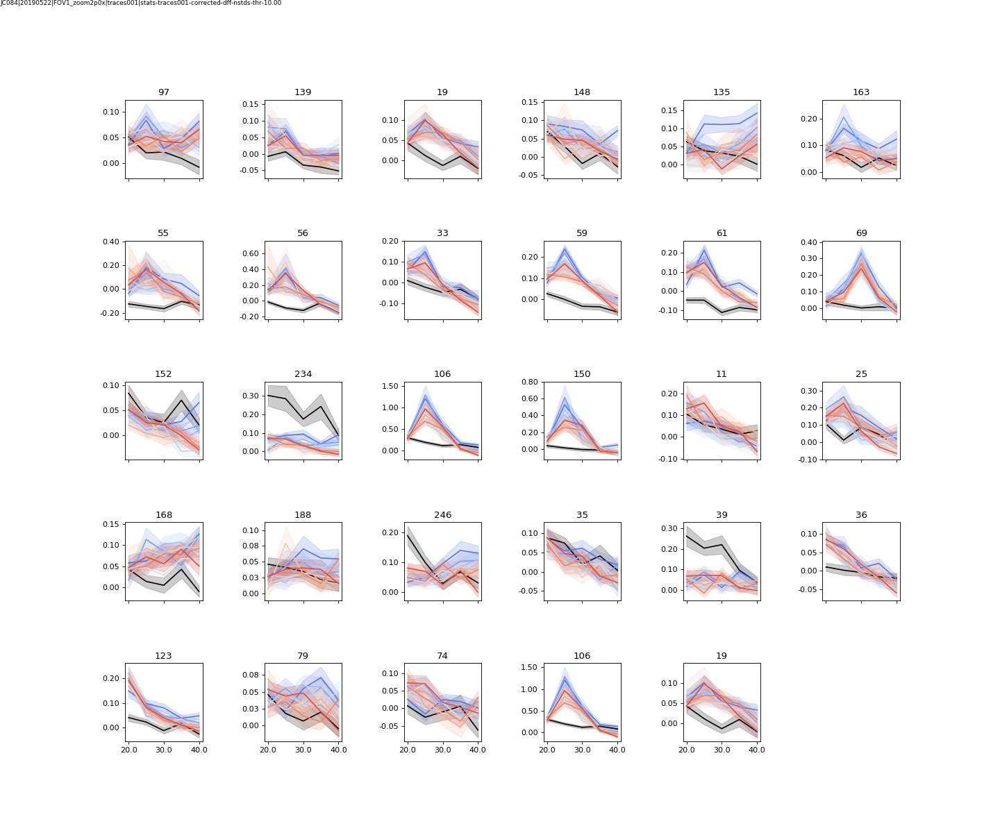

_c-#d55e00__size-tuning-colormorphlevel_V1__JC084_20190522_FOV1_zoom2p0x_traces001_stats-traces001-corrected-dff-nstds-thr-10.00_thr-dff-0.03_168-of-180rois
N rois to plot: 19
(4, 5)


<IPython.core.display.Javascript object>


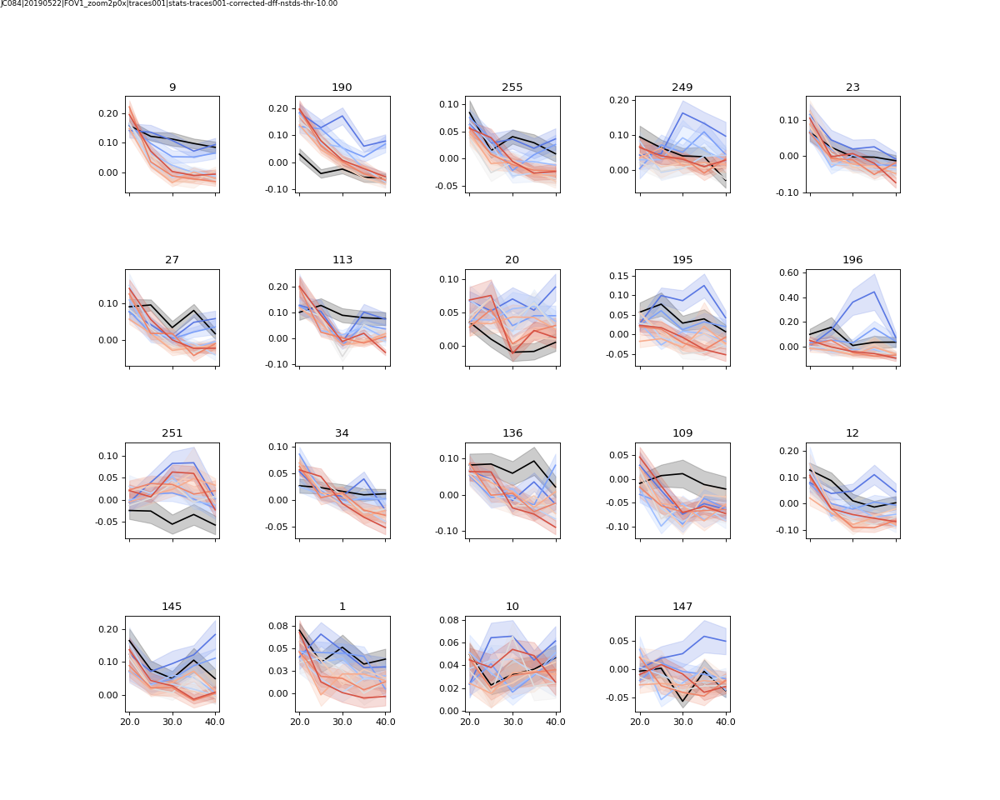

_c-#029e73__size-tuning-colormorphlevel_V1__JC084_20190522_FOV1_zoom2p0x_traces001_stats-traces001-corrected-dff-nstds-thr-10.00_thr-dff-0.03_168-of-180rois
N rois to plot: 2
(1, 2)


<IPython.core.display.Javascript object>


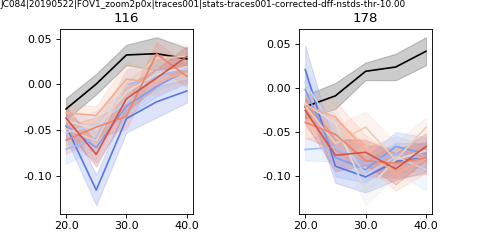

_c-#56b4e9__size-tuning-colormorphlevel_V1__JC084_20190522_FOV1_zoom2p0x_traces001_stats-traces001-corrected-dff-nstds-thr-10.00_thr-dff-0.03_168-of-180rois
N rois to plot: 9
(3, 3)


<IPython.core.display.Javascript object>


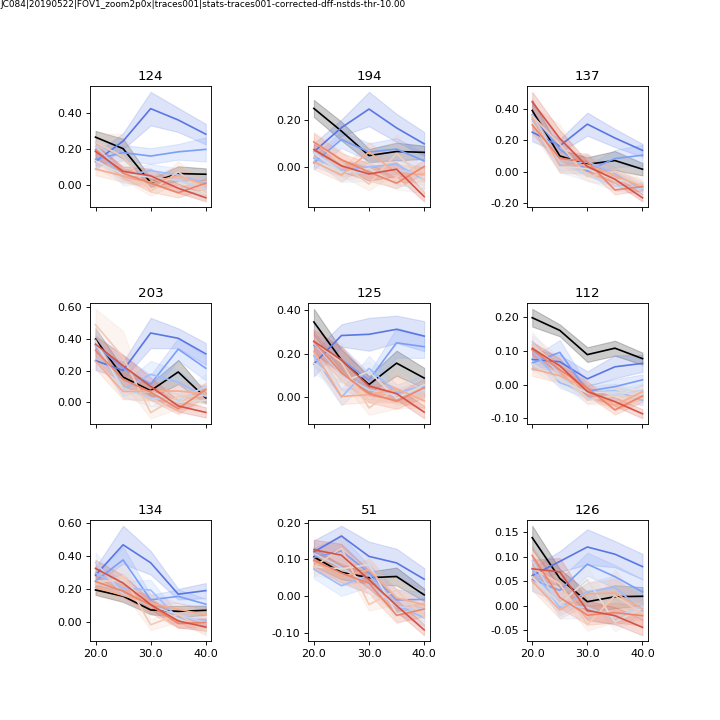

_c-#cc78bc__size-tuning-colormorphlevel_V1__JC084_20190522_FOV1_zoom2p0x_traces001_stats-traces001-corrected-dff-nstds-thr-10.00_thr-dff-0.03_168-of-180rois
N rois to plot: 13
(4, 4)


<IPython.core.display.Javascript object>


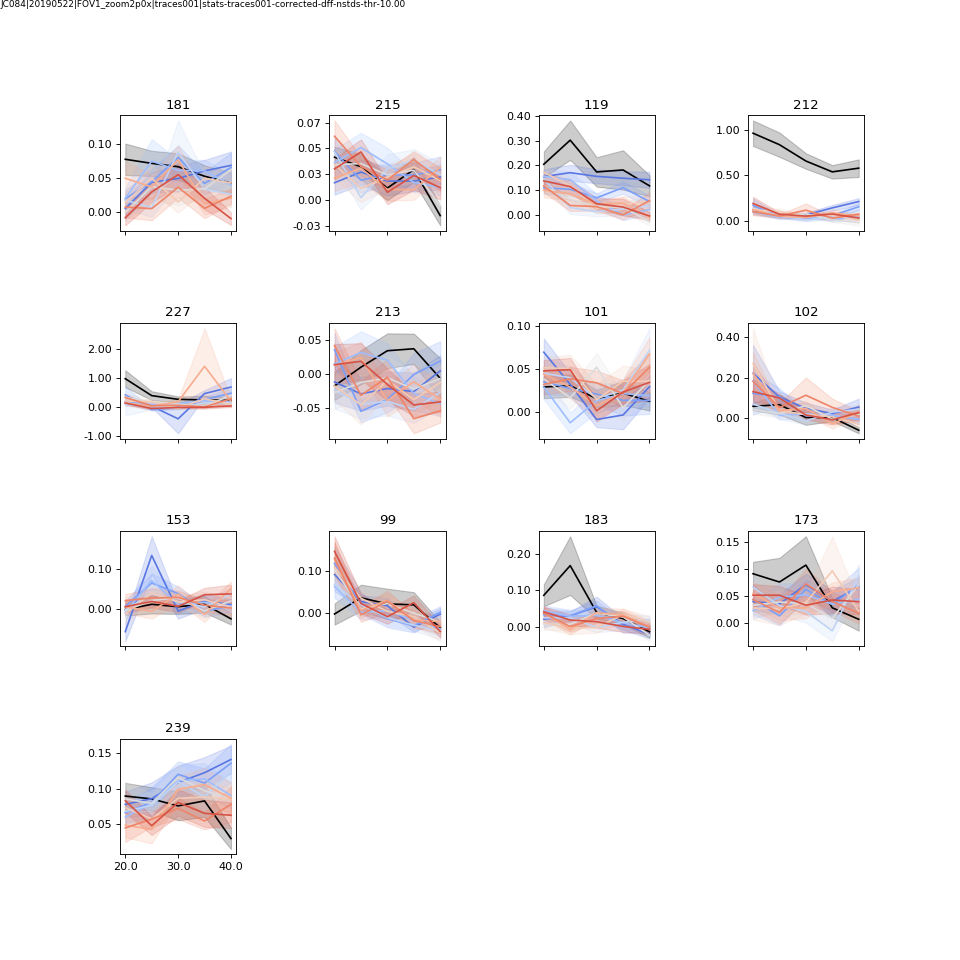

_c-#949494__size-tuning-colormorphlevel_V1__JC084_20190522_FOV1_zoom2p0x_traces001_stats-traces001-corrected-dff-nstds-thr-10.00_thr-dff-0.03_168-of-180rois
N rois to plot: 12
(3, 4)


<IPython.core.display.Javascript object>


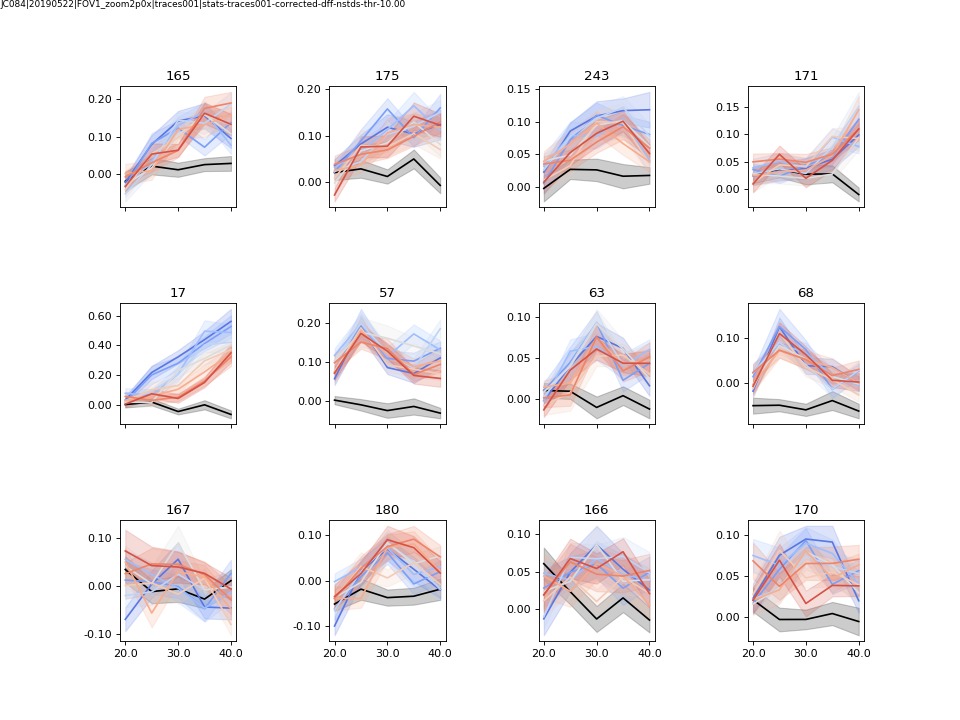

_c-#fbafe4__size-tuning-colormorphlevel_V1__JC084_20190522_FOV1_zoom2p0x_traces001_stats-traces001-corrected-dff-nstds-thr-10.00_thr-dff-0.03_168-of-180rois
N rois to plot: 26
(5, 6)


<IPython.core.display.Javascript object>


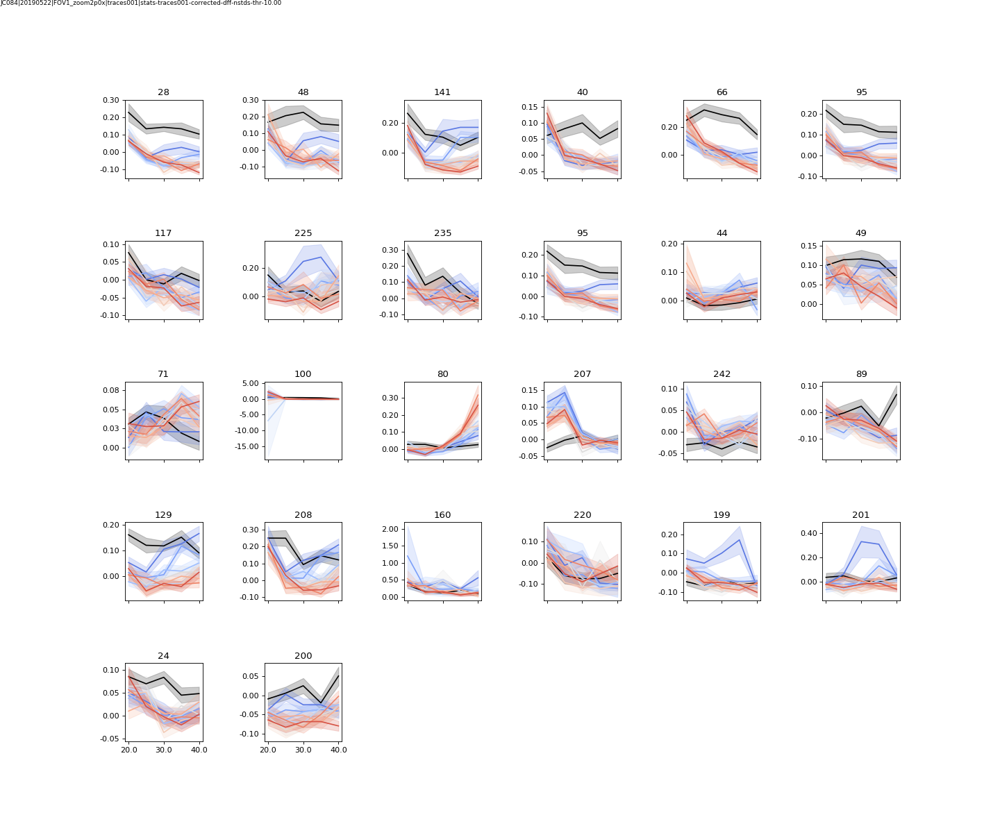

_c-#de8f05__size-tuning-colormorphlevel_V1__JC084_20190522_FOV1_zoom2p0x_traces001_stats-traces001-corrected-dff-nstds-thr-10.00_thr-dff-0.03_168-of-180rois
N rois to plot: 20
(4, 5)


<IPython.core.display.Javascript object>


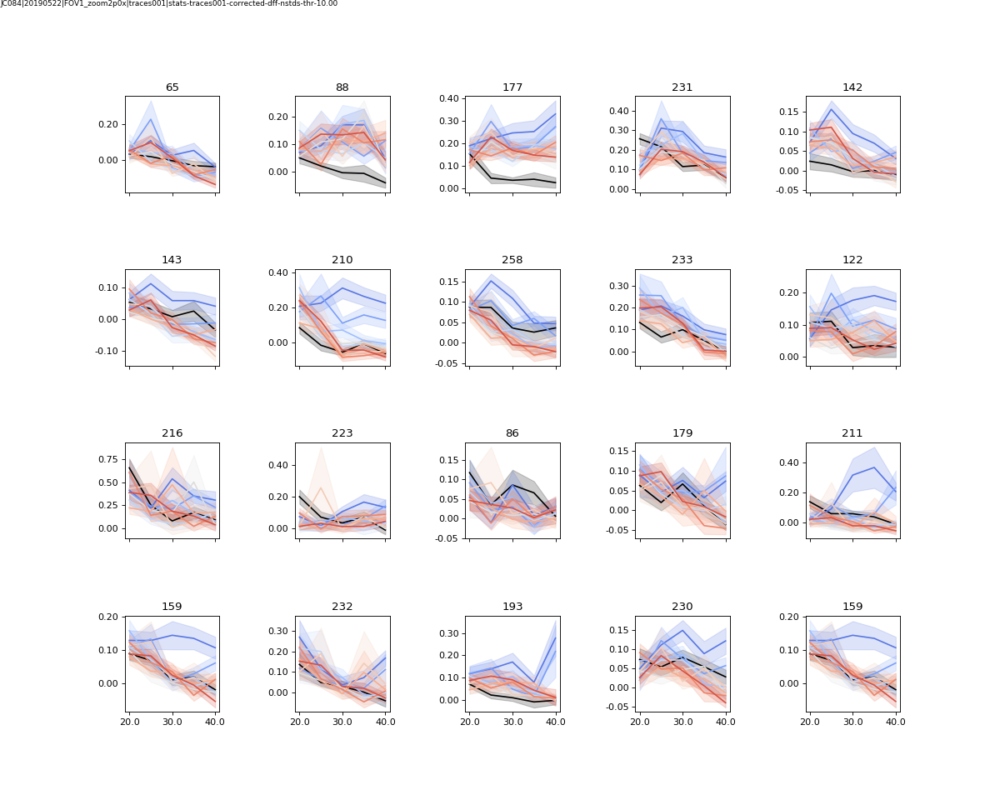

_c-#ca9161__size-tuning-colormorphlevel_V1__JC084_20190522_FOV1_zoom2p0x_traces001_stats-traces001-corrected-dff-nstds-thr-10.00_thr-dff-0.03_168-of-180rois


In [477]:
sharey=False

for k, curr_rois_list in cluster_classes.items():
    fig = plot_roi_tuning(df_mean, df_sem=df_sem,  rois_plot=curr_rois_list,  tune_values=transform_values, 
                          tune_name=transform_param,
                         hue_values=hue_values, hue_name=hue_param, hue_colors=hue_colors, sharey=sharey)

    figname = '_c-%s__%s-tuning-color%s_%s__%s' % (k, transform_param, hue_param, visual_area, data_id.replace('|', '_'))

    if threshold_dff:
        figname = '%s_thr-dff-%.2f_%i-of-%irois' % (figname, min_dff, len(rois_plot), len(estats.rois))
    else:
        figname = '%s_all-resp_%i-of-%irois' % (figname, len(rois_plot), len(estats.rois))

    if sharey:
        figname = '%s_sharey' % figname

    pl.savefig(os.path.join(curr_cluster_dir, '%s.png' % figname))
    print figname

In [247]:
data_id

'JC084|20190522|FOV1_zoom2p0x|traces001|stats-traces001-corrected-dff-nstds-thr-10.00'

<IPython.core.display.Javascript object>


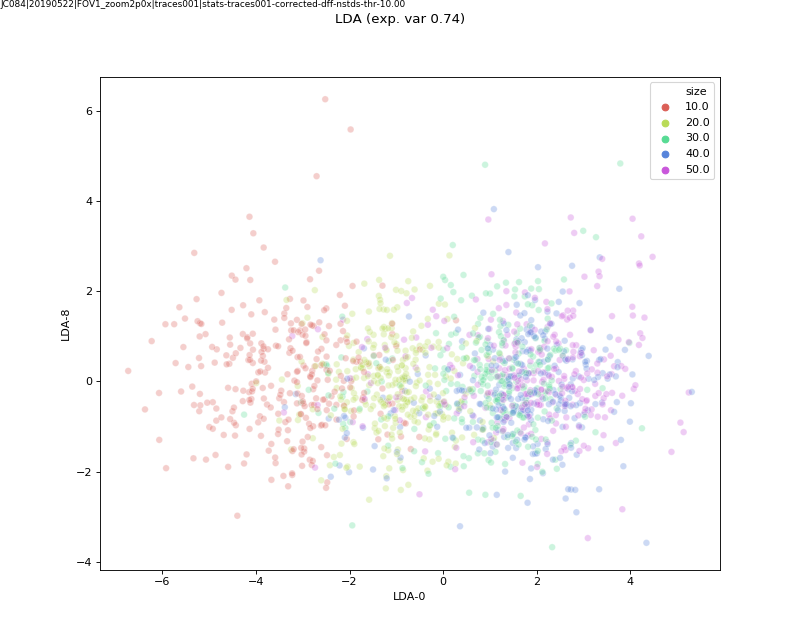

_reduce-cells-sample-trials_LDA-10comps_2d-D0D8_label-size


In [196]:
feature_type = 'cells'
sample_type = 'trials'
color_by = 'size'

colors = sns.color_palette("hls", len(df[color_by].unique()))

fig, ax = pl.subplots(figsize=(10,8))
d1 = 0
d2 = 8
sns.scatterplot(
    x="%s-%i" % (dimr_type, d1), 
    y="%s-%i" % (dimr_type, d2),
    hue=color_by,
    palette=colors,
    data=df,
    legend="full",
    alpha=0.3,
    ax=ax, 
)

fig.suptitle('%s (exp. var %.2f)' % (dimr_type, np.sum(dimr.explained_variance_ratio_[d1:d2+1])))
label_figure(fig, data_id)

figname = '_reduce-%s-sample-%s_%s-%icomps_2d-D%iD%i_label-%s' % (feature_type, sample_type, dimr_type, n_components, d1, d2, color_by)

pl.savefig(os.path.join(outdir, '%s.png' % figname))

print figname

In [123]:
colorlist

[(0.094084319280119982, 0.25456763098682095, 0.47479971877197091),
 (0.19002743319550042, 0.50423043478260865, 0.49565724681625223),
 (0.25661406784936197, 0.58550133779264224, 0.32284437777281283),
 (0.51073217528622183, 0.66205518207282921, 0.32917535903993705),
 (0.72417262727707499, 0.70351889483065944, 0.37379467833956326),
 (0.83429298450258282, 0.69227372549019617, 0.57867585985213765)]

In [111]:
print('%s (exp. var %.2f)' % (dimr_type, np.sum(dimr.explained_variance_ratio_[0:3])))

LDA (exp. var 0.54)


In [162]:
df[color_by]

0       20.0
1       10.0
2       10.0
3       50.0
4       30.0
5       30.0
6       40.0
7       50.0
8       20.0
9       40.0
10      30.0
11      30.0
12      20.0
13      40.0
14      50.0
15      20.0
16      30.0
17      30.0
18      10.0
19      40.0
20      50.0
21      20.0
22      10.0
23      40.0
24      30.0
25      40.0
26      10.0
27      40.0
28      10.0
29      40.0
        ... 
1470    10.0
1471    40.0
1472    10.0
1473    10.0
1474    40.0
1475    20.0
1476    40.0
1477    10.0
1478    30.0
1479    50.0
1480    50.0
1481    50.0
1482    30.0
1483    40.0
1484    50.0
1485    20.0
1486    20.0
1487    10.0
1488    10.0
1489    30.0
1490    30.0
1491    20.0
1492    40.0
1493    30.0
1494    50.0
1495    50.0
1496    40.0
1497    50.0
1498    40.0
1499    10.0
Name: size, Length: 1500, dtype: float64

#### plot in 3d

<IPython.core.display.Javascript object>


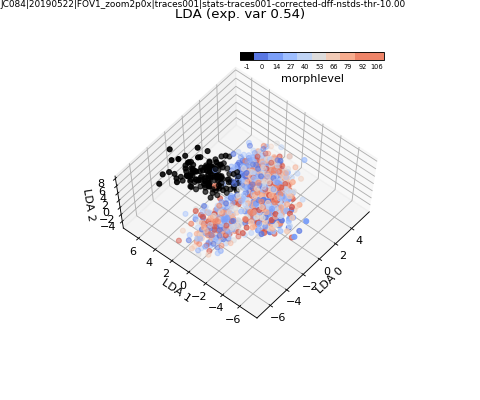

_reduce-cells-sample-trials_LDA-3comps_label-morphlevel_3D


In [172]:
color_by = 'morphlevel'
valuelist = sorted(sdf[color_by].unique())
if color_by=='size':
    colormap_name = 'cubehelix'
    colorlist = sns.color_palette(colormap_name, len(df[color_by].unique())+1)
else:
    colormap_name = 'coolwarm'
    colorlist = sns.color_palette(colormap_name, len(df[color_by].unique())+1)
    colorlist[0] = (0, 0, 0)
    new_colors = sns.color_palette(colormap_name, n_colors=len(df[color_by].unique())-1)
    colorlist[1:] = new_colors
    
df['param_ix'] = [list(sorted(sdf[color_by].unique())).index(pv) for pv in df[color_by] ]
df['colors'] = [colorlist[i] for i in df['param_ix']]

d3=2
#ax = pl.figure(figsize=(16,10)).gca(projection='3d')
fig = pl.figure(figsize=(6, 5))
import mpl_toolkits.mplot3d.axes3d as p3
ax = p3.Axes3D(fig)
p = ax.scatter(
    xs=df["%s-%i" % (dimr_type, d1)], 
    ys=df["%s-%i" % (dimr_type, d2)], 
    zs=df["%s-%i" % (dimr_type, d3)], 
    c=df['colors']
)
ax.set_xlabel('%s %i' % (dimr_type, d1))
ax.set_ylabel('%s %i' % (dimr_type, d2))
ax.set_zlabel('%s %i' % (dimr_type, d3))
cbar = create_color_bar(fig, colorlist[0:-1], valuelist, cbar_axes=[0.5, 0.85, 0.3, 0.02],  hue_param=color_by)
fig.subplots_adjust(top=0.7)
ax.dist=15
fig.suptitle('%s (exp. var %.2f)' % (dimr_type, np.sum(dimr.explained_variance_ratio_[0:3])))

label_figure(fig, data_id)
figname = '_reduce-%s-sample-%s_%s-%icomps_label-%s_3D' % (feature_type, sample_type, dimr_type, n_components, color_by)
pl.savefig(os.path.join(outdir, '%s.png' % figname))

print figname



In [269]:
X_s.shape

(5040, 50)

In [270]:
n_samples, n_features = X_s.shape
print("N samples: %i, N features: %i" % (n_samples, n_features))

N samples: 5040, N features: 50


#### Project 2D, color-code by cell and split groups

<IPython.core.display.Javascript object>


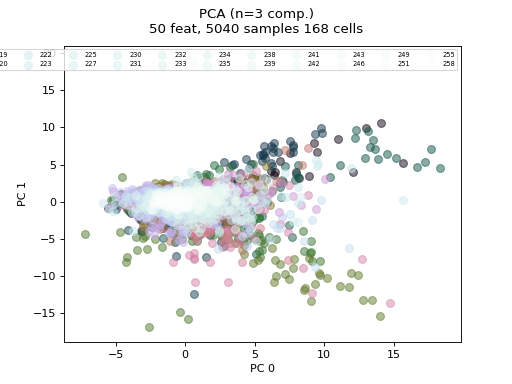

Text(0.5,0.98,u'PCA (n=3 comp.)\n50 feat, 5040 samples 168 cells')

In [271]:
fig, ax = pl.subplots() #.figure()
colors = sns.color_palette('cubehelix', n_colors=len(label_types))
lw = 1
#colors = itertools.cycle('bgrcmykbgrcmykbgrcmykbgrcmyk')

d1 = 0 
d2 = 1
for color, label in zip(colors, label_types):
    ax.scatter(X_r[labels == label, d1], X_r[labels == label, d2], color=color, label=label,
               alpha=.5, lw=lw, s=50, marker='o')
ax.legend(loc='bottom', shadow=False, scatterpoints=1, ncol=len(label_types)/2, fontsize=6)

xlim = ax.get_xlim()
ylim = ax.get_ylim()

ax.set_xlabel('PC %i' % d1)
ax.set_ylabel('PC %i' % d2)
fig.suptitle('%s (n=%i comp.)\n%i feat, %i samples %i cells' % (dimr_type, n_components, n_features, n_samples, len(curr_roi_list)))


#### Split by groups

In [189]:
outdir

'/n/coxfs01/julianarhee/aggregate-visual-areas/blobs-tuning/stats-traces001-corrected-dff-nstds-thr-10.00'

In [285]:
ixs = np.array(np.where(np.array(labels)==label)[0])
len(ixs)

30

In [289]:
data.iloc[ixs].max(axis=1)

39    0.938083
39    0.506007
39    0.488653
39    0.320022
39    0.720370
39    0.719082
39    0.733221
39    0.530717
39    0.641252
39    0.824675
39    0.814261
39    0.457037
39    0.896470
39    0.411746
39    0.403914
39    0.701766
39    0.539982
39    0.533753
39    0.529544
39    0.533636
39    0.537878
39    0.506649
39    0.436742
39    0.409134
39    0.418593
39    0.264019
39    0.243155
39    0.398338
39    0.433135
39    0.269069
dtype: float64

<IPython.core.display.Javascript object>


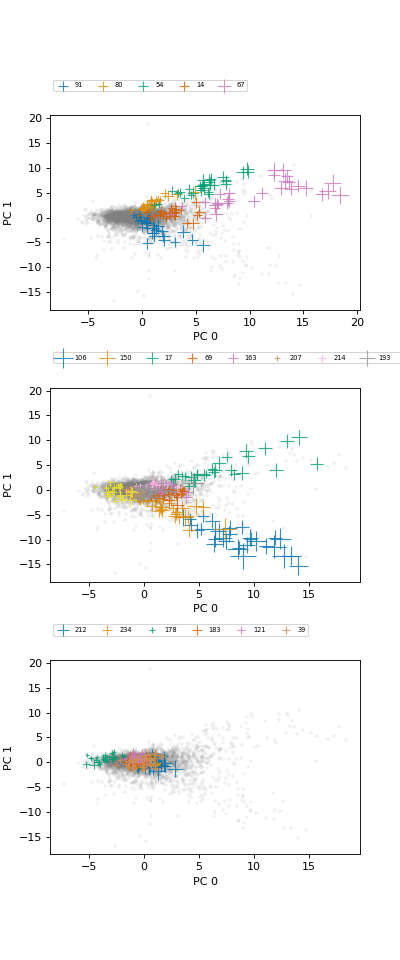

In [297]:
fig, axes = pl.subplots(3, 1, figsize=(5,12)) #.figure()
#colors = sns.color_palette('rainbow', n_colors=len(label_types)*2)
lw = 0.5
#colors = itertools.cycle('bgrcmykbgrcmykbgrcmykbgrcmyk')
label_types2 = []
#fig.suptitle('%s (n=%i comp.)\n%i feat, %i samples %i cells' % (dimr_type, n_components, n_features, n_samples, len(curr_roi_list)))

# class1 = [97, 54, 67, 180, 118, 165, 171, 175] #= np.linspace(0, len(label_types), 8)
# class2 = [59, 61, 56, 93, 91, 106, 150, 55]
# class3 = [119, 95, 66, 28, 183, 212, 234, 119]
,

class1 = [68, 93, 151, 63, 61, 106, 165, 171, 243, 155]
class2 = [91,80, 54, 14, 67]
class3 = [106, 150, 17, 69, 163, 207, 214, 193, 138]
class4 = [212, 234, 178, 183, 121, 39, ]

class_lists = [class2, class3, class4]

label_by='cell'
for i, (ax, curr_rois) in enumerate(zip(axes.flat, class_lists)):
    #curr_ixs = [label_types.index(r) for r in curr_rois]
    #curr_colors = [colors[r] for r in curr_ixs]
    #curr_colors = sns.color_palette('colorblind', n_colors=len(curr_rois))
    if label_by=='cell':
        curr_colors = sns.color_palette('colorblind', n_colors=len(curr_rois))
        curr_labels = copy.copy(curr_rois)
    elif label_by=='size':
        curr_colors = sns.color_palette('colorblind', n_colors=len(curr_rois))
        curr_labels = copy.copy(curr_rois)
        
    
    ax.scatter(X_r[:, 0], X_r[:, 1], color=(0.5, 0.5, 0.5, 0.1), s=20, marker='+')
    
    for color, label in zip(curr_colors, curr_rois):
        ixs = np.array(np.where(np.array(labels)==label)[0])
        sizes = data.iloc[ixs].max(axis=1)
        ax.scatter(X_r[np.array(labels) == label, 0], X_r[np.array(labels) == label, 1], color=color, label=label,
                   alpha=.8, lw=1, s=100*sizes, marker='+')
        
    ax.legend(loc='upper left', shadow=False, scatterpoints=1, 
              ncol=len(label_types)/2, fontsize=6,  bbox_to_anchor= (0, 1.2))
    #ax.set_xlim(xlim)
    #ax.set_ylim(ylim)

    ax.set_xlabel('PC %i' % d1)
    ax.set_ylabel('PC %i' % d2)
    
pl.subplots_adjust(hspace=0.4)
pl.savefig(os.path.join(outdir, 'label-by-cell_%s-ncomps-%i_nfeatures-50_nsamples-%i_manual-color-code.png' %(dimr_type, n_components, n_samples)))

In [90]:
outdir

'/n/coxfs01/julianarhee/aggregate-visual-areas/blob-tuning/stats-traces001-corrected-dff-nstds-thr-10.00'

In [301]:
5040/30.

168.0

In [ ]:
fig, axes = pl.subplots(3, 1, figsize=(5,12)) #.figure()
#colors = sns.color_palette('rainbow', n_colors=len(label_types)*2)
lw = 0.5

class1 = [68, 93, 151, 63, 61, 106, 165, 171, 243, 155]
class2 = [91,80, 54, 14, 67]
class3 = [106, 150, 17, 69, 163, 207, 214, 193, 138]
class4 = [212, 234, 178, 183, 121, 39, ]

class_lists = [class2, class3, class4]
data_sizes = []

label_by='size'
for i, (ax, curr_rois) in enumerate(zip(axes.flat, class_lists)):
    #curr_ixs = [label_types.index(r) for r in curr_rois]
    #curr_colors = [colors[r] for r in curr_ixs]
    #curr_colors = sns.color_palette('colorblind', n_colors=len(curr_rois))
    if label_by='cell':
        curr_colors = sns.color_palette('colorblind', n_colors=len(curr_rois))
        curr_labels = copy.copy(curr_rois)
    elif label_by=='size':
        curr_colors = sns.color_palette('colorblind', n_colors=len(curr_rois))
        curr_labels = copy.copy(curr_rois)
        
        
    ax.scatter(X_r[:, 0], X_r[:, 1], color=(0.5, 0.5, 0.5, 0.1), s=20, marker='+')
    
    for label in zip(curr_rois):
        ixs = np.array(np.where(np.array(labels)==label)[0])
        sizes = data.iloc[ixs].max(axis=1)
        curr_colors = [data_sizes[i] for i in ixs]
        ax.scatter(X_r[np.array(labels) == label, 0], X_r[np.array(labels) == label, 1], color=curr_colors, label=label,
                   alpha=.8, lw=1, s=100*sizes, marker='+')
        
    ax.legend(loc='upper left', shadow=False, scatterpoints=1, 
              ncol=len(label_types)/2, fontsize=6,  bbox_to_anchor= (0, 1.2))
    #ax.set_xlim(xlim)
    #ax.set_ylim(ylim)

    ax.set_xlabel('PC %i' % d1)
    ax.set_ylabel('PC %i' % d2)
    
pl.subplots_adjust(hspace=0.4)
pl.savefig(os.path.join(outdir, 'label-by-cell_%s-ncomps-%i_nfeatures-50_nsamples-%i_manual-color-code.png' %(dimr_type, n_components, n_samples)))

<IPython.core.display.Javascript object>


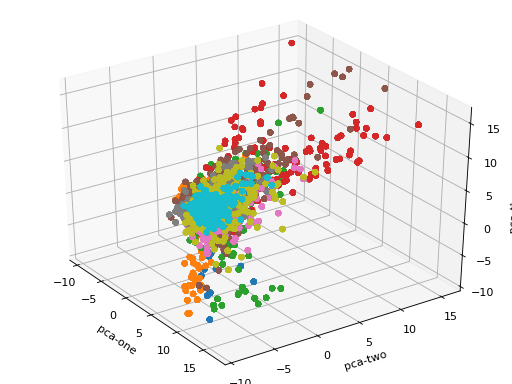

In [59]:
d3=2
#ax = pl.figure(figsize=(16,10)).gca(projection='3d')
fig = pl.figure()
import mpl_toolkits.mplot3d.axes3d as p3
ax = p3.Axes3D(fig)
ax.scatter(
    xs=df["pca-%i" % d1], 
    ys=df["pca-%i" % d2], 
    zs=df["pca-%i" % d3], 
    c=df["cell"], 
    cmap='tab10'
)
ax.set_xlabel('pca-one')
ax.set_ylabel('pca-two')
ax.set_zlabel('pca-three')
pl.show()

# Visualize first few eigenvectors

In [ ]:
dimr.components_.shape

In [ ]:
n_sz = 5
n_mp = 10
sdf['size'].reshape(n_sz, n_mp)

In [92]:
fig, axes = plt.subplots(3, 8, figsize=(9, 4),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))
for i, ax in enumerate(axes.flat):
    ax.imshow(pca.components_[i].reshape(62, 47), cmap='bone')


# Split up "samples" (i.e., cells) so that can visualize sparsely

<IPython.core.display.Javascript object>


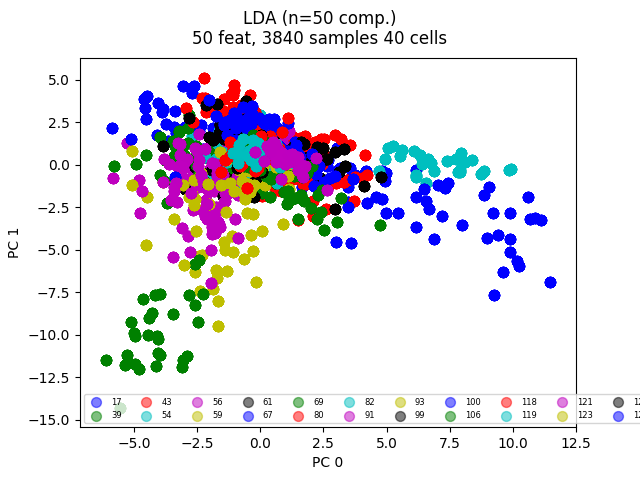

Text(0.5,0.98,u'LDA (n=50 comp.)\n50 feat, 3840 samples 40 cells')

In [614]:
fig, ax = pl.subplots() #.figure()
colors = sns.color_palette('cubehelix', n_colors=len(label_types))
lw = 1
#colors = itertools.cycle('bgrcmykbgrcmykbgrcmykbgrcmyk')

d1 = 0 
d2 = 1
for color, label in zip(colors, label_types):
    ax.scatter(X_r[labels == label, d1], X_r[labels == label, d2], color=color, label=label,
               alpha=.5, lw=lw, s=50, marker='o')
ax.legend(loc='bottom', shadow=False, scatterpoints=1, ncol=len(label_types)/2, fontsize=6)

xlim = ax.get_xlim()
ylim = ax.get_ylim()

ax.set_xlabel('PC %i' % d1)
ax.set_ylabel('PC %i' % d2)
fig.suptitle('%s (n=%i comp.)\n%i feat, %i samples %i cells' % (dimr_type, n_components, n_features, n_samples, len(curr_roi_list)))


In [575]:
np.linspace(0, len(rois_plot), 8)

array([   0.        ,   18.28571429,   36.57142857,   54.85714286,
         73.14285714,   91.42857143,  109.71428571,  128.        ])

<IPython.core.display.Javascript object>


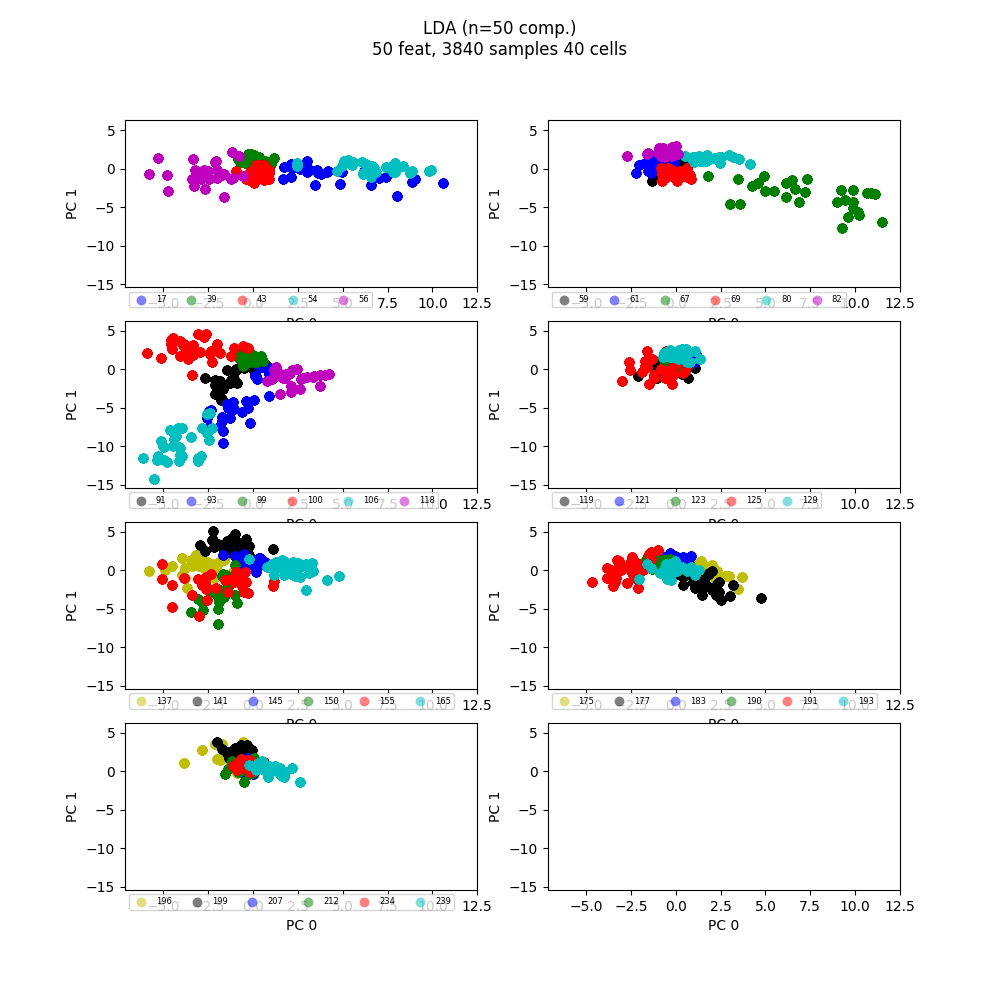

0 0.0
1 5.71428571429
2 11.4285714286
3 17.1428571429
4 22.8571428571
5 28.5714285714
6 34.2857142857
7 40.0


In [615]:
fig, axes = pl.subplots(4, 2, figsize=(10,10)) #.figure()
colors = sns.color_palette('cubehelix', n_colors=len(label_types))
lw = 0.5
colors = itertools.cycle('bgrcmykbgrcmykbgrcmykbgrcmyk')

fig.suptitle('%s (n=%i comp.)\n%i feat, %i samples %i cells' % (dimr_type, n_components, n_features, n_samples, len(curr_roi_list)))

roi_start_ixs = np.linspace(0, len(label_types), 8)

for i, (ax, ri) in enumerate(zip(axes.flat, roi_start_ixs)):
    print i, ri
    s_ix = int(ri)
    if i == len(roi_start_ixs)-1:
        e_ix = -1
    else:
        e_ix = int(roi_start_ixs[i+1])
    for color, label in zip(colors, label_types[s_ix:e_ix]):
        ax.scatter(X_r[labels == label, 0], X_r[labels == label, 1], color=color, label=label,
                   alpha=.5, lw=0, s=50, marker='o')
        
    ax.legend(loc='upper left', shadow=False, scatterpoints=1, 
              ncol=len(label_types)/2, fontsize=6,  bbox_to_anchor= (0, 0))
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)

    ax.set_xlabel('PC %i' % d1)
    ax.set_ylabel('PC %i' % d2)


# t-SNE

In [52]:

from matplotlib.ticker import NullFormatter
from sklearn import manifold, datasets
import time

In [61]:
mdf = meanr.loc[rois_plot]
mdf.shape


(128, 50)

In [72]:
Xm = StandardScaler().fit_transform(mdf)

dfm = pd.DataFrame(Xm, index=mdf.index, columns=mdf.columns)

In [73]:
dfm.head()

config,config001,config002,config003,config004,config005,config006,config007,config008,config009,config010,...,config041,config042,config043,config044,config045,config046,config047,config048,config049,config050
5,-0.431411,-0.071801,0.140662,0.245632,0.199499,-0.118033,-0.872907,-0.944681,-1.211917,-1.028969,...,-0.054421,-0.262492,-0.311043,0.084610,-0.054895,-0.072695,-0.334629,-0.334166,0.377903,0.072676
9,0.191242,0.340446,0.536931,0.485794,0.803152,0.340307,-0.023188,-0.207747,-0.374260,-0.030608,...,0.588250,-0.356334,-0.711780,-0.319917,-0.494508,0.364743,-0.247822,-0.478904,-0.380741,-0.001849
11,-0.163182,-0.226383,-0.071030,-0.518061,0.123285,-0.340707,-0.381538,-0.607363,-0.852357,-1.261981,...,0.413011,-0.180588,-0.122273,-0.120554,-0.524921,0.100241,0.314008,-0.072312,-0.002139,-0.585394
12,0.068303,0.044746,-0.399758,-0.668536,-0.146581,-0.096390,-0.551956,-0.650337,-0.013157,-0.389247,...,-0.162323,-0.918212,-1.659560,-1.179077,-0.904460,-0.030935,-0.940411,-0.932777,-1.055979,-0.574343
14,-0.780249,-0.523896,-0.580332,-0.669661,-0.452952,-0.807546,-0.186815,-0.541912,-0.493854,-0.145518,...,-0.871332,0.528144,0.725635,1.342414,0.875649,-0.703920,0.673879,0.948788,1.367007,0.995261


In [64]:
time_start = time.time()
tsne = manifold.TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(dfm)
print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 128 samples in 0.000s...
[t-SNE] Computed neighbors for 128 samples in 0.002s...
[t-SNE] Computed conditional probabilities for sample 128 / 128
[t-SNE] Mean sigma: 2.491244
[t-SNE] KL divergence after 250 iterations with early exaggeration: 54.291122
[t-SNE] Error after 300 iterations: 0.461049
t-SNE done! Time elapsed: 0.427944898605 seconds


In [69]:
dfm['tsne-1'] = tsne_results[:,0]
dfm['tsne-2'] = tsne_results[:,1]
dfm['cell'] = mdf.index.tolist()

In [70]:
colors = sns.color_palette("hls", len(label_types))


<IPython.core.display.Javascript object>


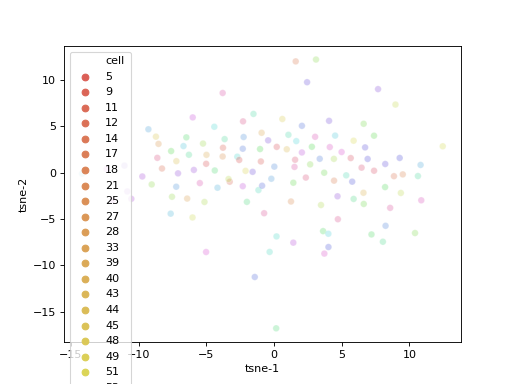

In [71]:
fig, ax = pl.subplots()

sns.scatterplot(
    x="tsne-1", y="tsne-2",
    hue="cell",
    palette=colors,
    data=dfm,
    legend="full",
    alpha=0.3
)

# PCA + t-SNE

In [65]:
n_components = 20
dimr_type = 'PCA'

if dimr_type == 'LDA':
    dimr = LinearDiscriminantAnalysis(n_components=n_components)
else:
    dimr = PCA(n_components=n_components)
    
X_r = dimr.fit(X_s, labels).transform(X_s)
# Percentage of variance explained for each components
print('Explained variation per principal component: {}'.format(dimr.explained_variance_ratio_))
print('Total explained variance {}: {}'.format( n_components, np.sum(dimr.explained_variance_ratio_)))


Explained variation per principal component: [ 0.40284701  0.21663569  0.1369496   0.06591518  0.04439958  0.02223027
  0.01939242  0.01647228  0.01008412  0.00664497  0.00611441  0.00500225
  0.00416589  0.00406842  0.00363604  0.00336755  0.00279924  0.0023929
  0.00195065  0.00181702]
Total explained variance 20: 0.976885502308


In [66]:
time_start = time.time()
tsne = manifold.TSNE(n_components=2, verbose=1, perplexity=1000, n_iter=300)
tsne_results = tsne.fit_transform(X_r)
print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))


NameError: name 'manifold' is not defined

In [98]:
df.shape

(115200, 53)

In [99]:
tsne_results.shape

(115200, 2)

In [100]:
df = pd.DataFrame(X_s, index=X.index, columns=X.columns)
df['tsne-1'] = tsne_results[:,0]
df['tsne-2'] = tsne_results[:,1]
df['cell'] = df.index.tolist()

<IPython.core.display.Javascript object>


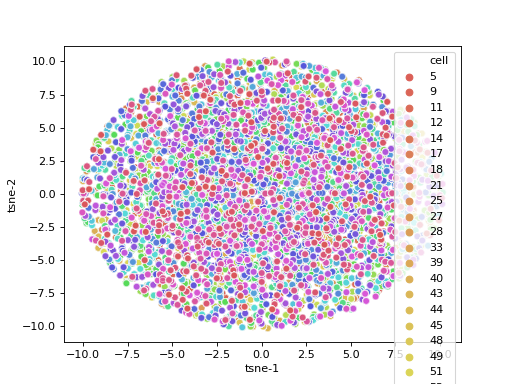

In [101]:
fig, ax = pl.subplots()

sns.scatterplot(
    x="tsne-1", y="tsne-2",
    hue="cell",
    palette=colors,
    data=df,
    legend="full",
    alpha=0.3
)

In [81]:
n_components = 2
(fig, subplots) = pl.subplots(1, 5, figsize=(15, 8))
perplexities = [5, 30, 50, 100]


for i, perplexity in enumerate(perplexities):
    ax = subplots[i]

    t0 = time.time()
    tsne = manifold.TSNE(n_components=n_components, init='random',
                         random_state=0, perplexity=perplexity)
    Y = tsne.fit_transform(X_r)
    t1 = time.time()
    print("uniform grid, perplexity=%d in %.2g sec" % (perplexity, t1 - t0))

    ax.set_title("Perplexity=%d" % perplexity)
    ax.scatter(Y[:, 0], Y[:, 1], c=colors)
    ax.xaxis.set_major_formatter(NullFormatter())
    ax.yaxis.set_major_formatter(NullFormatter())
    ax.axis('tight')

<IPython.core.display.Javascript object>

KeyboardInterrupt: 

# Cluster: k-means

In [391]:
from sklearn import metrics

n_samples, n_features = X_s.shape
print("N samples: %i, N features: %i" % (n_samples, n_features))
n_clusters = 3 #len(np.unique(labels))

sample_size = 300

print("n_digits: %d, \t n_samples %d, \t n_features %d"
      % (n_digits, n_samples, n_features))


print(82 * '_')
print('init\t\ttime\tinertia\thomo\tcompl\tv-meas\tARI\tAMI\tsilhouette')


def bench_k_means(estimator, name, data):
    t0 = time()
    estimator.fit(data)
    print('%-9s\t%.2fs\t%i\t%.3f\t%.3f\t%.3f\t%.3f\t%.3f\t%.3f'
          % (name, (time() - t0), estimator.inertia_,
             metrics.homogeneity_score(labels, estimator.labels_),
             metrics.completeness_score(labels, estimator.labels_),
             metrics.v_measure_score(labels, estimator.labels_),
             metrics.adjusted_rand_score(labels, estimator.labels_),
             metrics.adjusted_mutual_info_score(labels,  estimator.labels_),
                                                #average_method='arithmetic'),
             metrics.silhouette_score(data, estimator.labels_,
                                      metric='euclidean',
                                      sample_size=sample_size)))

bench_k_means(KMeans(init='k-means++', n_clusters=n_clusters, n_init=10),
              name="k-means++", data=X_s)

bench_k_means(KMeans(init='random', n_clusters=n_clusters, n_init=10),
              name="random", data=X_s)
# in this case the seeding of the centers is deterministic, hence we run the
# kmeans algorithm only once with n_init=1
pca = PCA(n_components=n_clusters).fit(X_s)
bench_k_means(KMeans(init=pca.components_, n_clusters=n_clusters, n_init=1),
              name="PCA-based",
              data=X_s)
print(82 * '_')


N samples: 3840, N features: 50
n_digits: 10, 	 n_samples 3840, 	 n_features 50
__________________________________________________________________________________
init		time	inertia	homo	compl	v-meas	ARI	AMI	silhouette
k-means++	0.25s	171864	0.073	0.585	0.131	0.004	0.066	0.205
random   	0.24s	171865	0.072	0.578	0.128	0.004	0.065	0.203
PCA-based	0.02s	171884	0.079	0.574	0.139	0.004	0.072	0.231
__________________________________________________________________________________


In [392]:
from sklearn.cluster import KMeans


In [578]:
n_clusters = 10
km = KMeans(init='k-means++', n_clusters=n_clusters, n_init=10)
km.fit(X_r)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=10, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [579]:

# Step size of the mesh. Decrease to increase the quality of the VQ.
h = .02     # point in the mesh [x_min, x_max]x[y_min, y_max].

# Plot the decision boundary. For that, we will assign a color to each
x_min, x_max = X_r[:, 0].min() - 1, X_r[:, 0].max() + 1
y_min, y_max = X_r[:, 1].min() - 1, X_r[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

# Obtain labels for each point in mesh. Use last trained model.
Z = km.predict(np.c_[xx.ravel(), yy.ravel()])

# Put the result into a color plot
Z = Z.reshape(xx.shape)


<IPython.core.display.Javascript object>


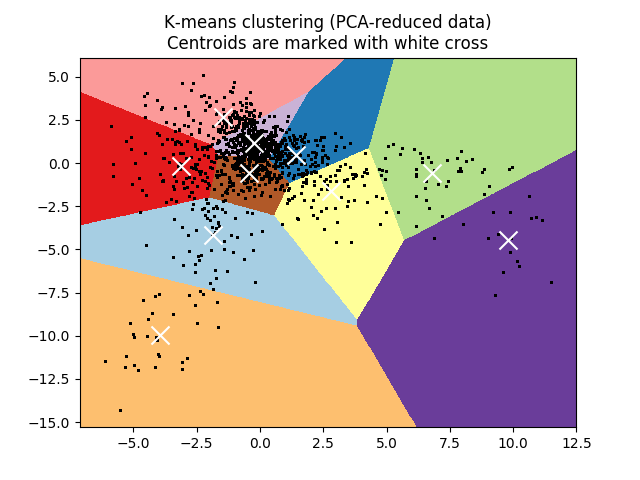

(-15.294832014023354, 6.1096120003474113)

In [580]:
pl.figure()
pl.clf()
pl.imshow(Z, interpolation='nearest',
           extent=(xx.min(), xx.max(), yy.min(), yy.max()),
           cmap=pl.cm.Paired,
           aspect='auto', origin='lower')


pl.plot(X_r[:, 0], X_r[:, 1], 'k.', markersize=2)
# Plot the centroids as a white X
centroids = km.cluster_centers_
pl.scatter(centroids[:, 0], centroids[:, 1],
            marker='x', s=169, linewidths=3,
            color='w', zorder=10)
pl.title('K-means clustering (%s-reduced data)\n'
          'Centroids are marked with white cross' % dimr_type)
pl.xlim(x_min, x_max)
pl.ylim(y_min, y_max)

In [408]:
df2 = meanr.loc[rois_plot]
df2.head()

config,config001,config002,config003,config004,config005,config006,config007,config008,config009,config010,...,config041,config042,config043,config044,config045,config046,config047,config048,config049,config050
5,0.011371,0.018404,0.017156,0.019427,0.007100,0.025149,-0.003903,-0.000157,-0.011274,-0.009563,...,0.033823,0.012127,0.007013,0.004041,0.003624,0.029589,0.015487,0.003578,0.015953,-0.000303
9,0.043880,0.033851,0.030019,0.026400,0.022550,0.042501,0.037319,0.028331,0.018878,0.025341,...,0.062850,0.009303,-0.004800,-0.007900,-0.011014,0.053034,0.018959,-0.000899,-0.004351,-0.003293
11,0.025375,0.012611,0.010285,-0.002744,0.005150,0.016719,0.019935,0.012883,0.001668,-0.017710,...,0.054935,0.014593,0.012578,-0.002015,-0.012027,0.038858,0.041427,0.011678,0.005782,-0.026702
12,0.037461,0.022771,-0.000385,-0.007113,-0.001757,0.025968,0.011667,0.011221,0.031876,0.012802,...,0.028950,-0.007608,-0.032738,-0.033261,-0.024665,0.031827,-0.008739,-0.014939,-0.022422,-0.026258
14,-0.006842,0.001463,-0.006247,-0.007146,-0.009597,-0.000955,0.029381,0.015413,0.014573,0.021324,...,-0.003073,0.035923,0.037573,0.041169,0.034609,-0.004242,0.055818,0.043263,0.042425,0.036706


In [409]:
labels_true = df2.index.tolist()
label_types = sorted(np.unique(labels))

Xs = StandardScaler().fit_transform(df2)


In [423]:
Xs.shape

(128, 50)

In [426]:
X_r.shape

(3840, 2)

In [427]:
len(labels)

3840

In [428]:
from sklearn.cluster import AffinityPropagation
import itertools
import copy

In [432]:
# Compute Affinity Propagation
X = copy.copy(X_r)

af = AffinityPropagation(preference=None).fit(X)
labels_true = copy.copy(labels)
cluster_centers_indices = af.cluster_centers_indices_
labels_pred = af.labels_

n_clusters_ = len(cluster_centers_indices)

print('Estimated number of clusters: %d' % n_clusters_)
print("Homogeneity: %0.3f" % metrics.homogeneity_score(labels_true, labels_pred))
print("Completeness: %0.3f" % metrics.completeness_score(labels_true, labels_pred))
print("V-measure: %0.3f" % metrics.v_measure_score(labels_true, labels_pred))
print("Adjusted Rand Index: %0.3f"
      % metrics.adjusted_rand_score(labels_true, labels_pred))
print("Adjusted Mutual Information: %0.3f"
      % metrics.adjusted_mutual_info_score(labels_true, labels_pred))#,
                                           #average_method='arithmetic'))
print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(X, labels_pred, metric='sqeuclidean'))


Estimated number of clusters: 1174
Homogeneity: 0.653
Completeness: 0.515
V-measure: 0.576
Adjusted Rand Index: 0.038
Adjusted Mutual Information: 0.104
Silhouette Coefficient: 0.227


<IPython.core.display.Javascript object>


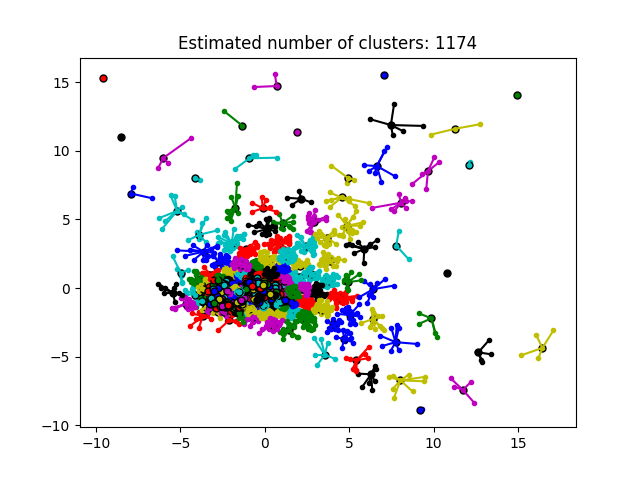

In [433]:

pl.figure()

colors = itertools.cycle('bgrcmykbgrcmykbgrcmykbgrcmyk')
#colors = sns.color_palette('cubehelix', n_colors=n_clusters)
for k, col in zip(range(n_clusters_), colors):
    class_members = labels_pred == k
    cluster_center = X[cluster_centers_indices[k]]
    pl.plot(X[class_members, 0], X[class_members, 1], col + '.')
    pl.plot(cluster_center[0], cluster_center[1], 'o', markerfacecolor=col,
             markeredgecolor='k', markersize=5)
    for x in X[class_members]:
        pl.plot([cluster_center[0], x[0]], [cluster_center[1], x[1]], col)

pl.title('Estimated number of clusters: %d' % n_clusters_)
pl.show()

In [440]:
from sklearn.cluster import AgglomerativeClustering
import mpl_toolkits.mplot3d.axes3d as p3
import time


In [461]:
Xd = StandardScaler().fit_transform(df)

X = copy.copy(Xd)


In [462]:
X.shape

(3840, 50)

Compute unstructured hierarchical clustering...
Elapsed time: 0.52s
Number of points: 3840


<IPython.core.display.Javascript object>


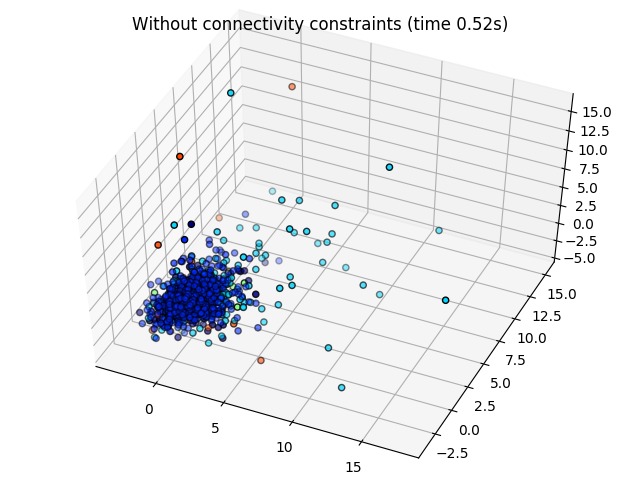

Text(0.5,0.92,u'Without connectivity constraints (time 0.52s)')

In [473]:
# #############################################################################
# Compute clustering
print("Compute unstructured hierarchical clustering...")
st = time.time()
ward = AgglomerativeClustering(n_clusters=6, linkage='ward').fit(X)
elapsed_time = time.time() - st
label = ward.labels_
print("Elapsed time: %.2fs" % elapsed_time)
print("Number of points: %i" % label.size)

# #############################################################################
# Plot result
fig = pl.figure()

ax = p3.Axes3D(fig)
ax.view_init(7, -80)
for l in np.unique(label):
    ax.scatter(X[label == l, 0], X[label == l, 1], X[label == l, 2],
               color=pl.cm.jet(np.float(l) / np.max(label + 1)),
               s=20, edgecolor='k')
pl.title('Without connectivity constraints (time %.2fs)' % elapsed_time)



In [464]:
# #############################################################################
# Define the structure A of the data. Here a 10 nearest neighbors
from sklearn.neighbors import kneighbors_graph
connectivity = kneighbors_graph(X, n_neighbors=10, include_self=False)


Compute structured hierarchical clustering...
Elapsed time: 13.26s
Number of points: 3840


<IPython.core.display.Javascript object>


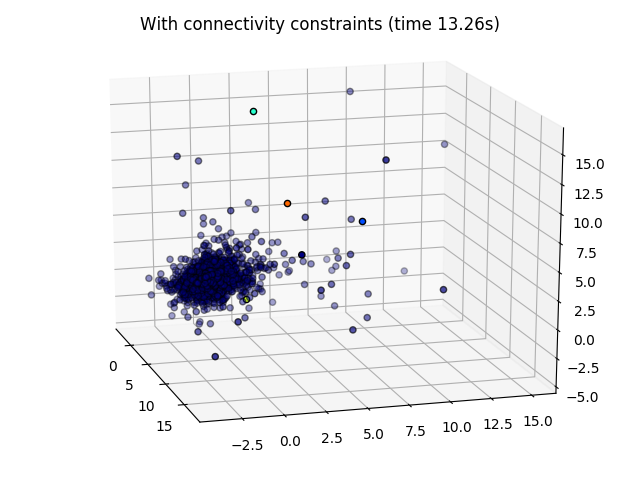

In [471]:
# #############################################################################
# Compute clustering
print("Compute structured hierarchical clustering...")
st = time.time()
ward = AgglomerativeClustering(n_clusters=5, connectivity=connectivity,
                               #distance_threshold=10,
                               affinity='l2',
                               linkage='complete').fit(X)
elapsed_time = time.time() - st
label = ward.labels_
print("Elapsed time: %.2fs" % elapsed_time)
print("Number of points: %i" % label.size)


# #############################################################################
# Plot result
fig = pl.figure()
ax = p3.Axes3D(fig)
ax.view_init(7, -80)
for l in np.unique(label):
    ax.scatter(X[label == l, 0], X[label == l, 1], X[label == l, 2],
               color=pl.cm.jet(float(l) / np.max(label + 1)),
               s=20, edgecolor='k')
pl.title('With connectivity constraints (time %.2fs)' % elapsed_time)

pl.show()


In [213]:
transform_values

[10.0, 20.0, 30.0, 40.0, 50.0]

In [48]:
data_id = '|'.join([animalid, session, fov, traceid, stats_desc])

exp = util.Objects(animalid, session, fov, traceid=traceid, rootdir=rootdir)
# Get stimulus conditions
sdf = exp.get_stimuli()
sdf = reformat_morph_values(sdf)
sizes = np.array(sorted(sdf['size'].unique()))
morphs = np.array(sorted(sdf['morphlevel'].unique()))

n_sizes = len(sdf['size'].unique())
n_morphs = len(sdf['morphlevel'].unique()) 
if n_sizes != n_sz or n_morphs != n_mp:
    incorrect_nvalues.append(skey)
    pass

rstats, rlist, _ = util.get_roi_stats(animalid, session, fov, exp_name=exp.name,
                             response_type=response_type, responsive_test=responsive_test,
                             responsive_thr=responsive_thr, n_stds=n_stds)
rstats = rstats['nframes_above']

# Get metrics for each condition
estats = exp.get_stats(responsive_test=responsive_test, responsive_thr=responsive_thr, n_stds=n_stds)
meanr = pd.concat([pd.Series(estats.gdf.get_group(roi).groupby(['config']).mean()['dff'], name=roi) \
                   for roi in estats.rois], axis=1).T
assert len(np.where(np.isnan(meanr))[0])==0
semr = pd.concat([pd.Series(estats.gdf.get_group(roi).groupby(['config']).sem()['dff'], name=roi) \
                   for roi in estats.rois], axis=1).T


# Get ROI list
if threshold_dff:
    rois_plot = meanr[(meanr.max(axis=1) > min_dff)].index.tolist()
else:
    rois_plot = meanr.index.tolist()
print("Plotting %i of %i responsive cells." % (len(rois_plot), len(meanr.index.tolist())))

df_mean = meanr.loc[rois_plot]
df_sem = semr.loc[rois_plot]

hue_name = 'size' if tune_name=='morph' else 'morph'
tune_values = morphs.copy() if tune_name=='morph' else sizes.copy()
hue_values = sizes.copy() if tune_name=='morph' else morphs.copy()
hcolors = sns.color_palette('gray_r', n_colors=n_sz) if tune_name=='morph' else sns.color_palette('gray_r', n_colors=n_mp) 


... [JC090|20190605|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
... renaming experiment to run name: combined_blobs_static
Getting stimulus info for: combined_blobs_static
... loading ROI stats: nstds
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
... offset: 385.58
... adjusting for equal reps / condn...
... updating self
filtering responsive cells: nstds
... getting responsive cells (test: nstds, thr: 10.00')
Plotting 141 of 161 responsive cells.


N rois to plot: 141
(12, 12)


<IPython.core.display.Javascript object>


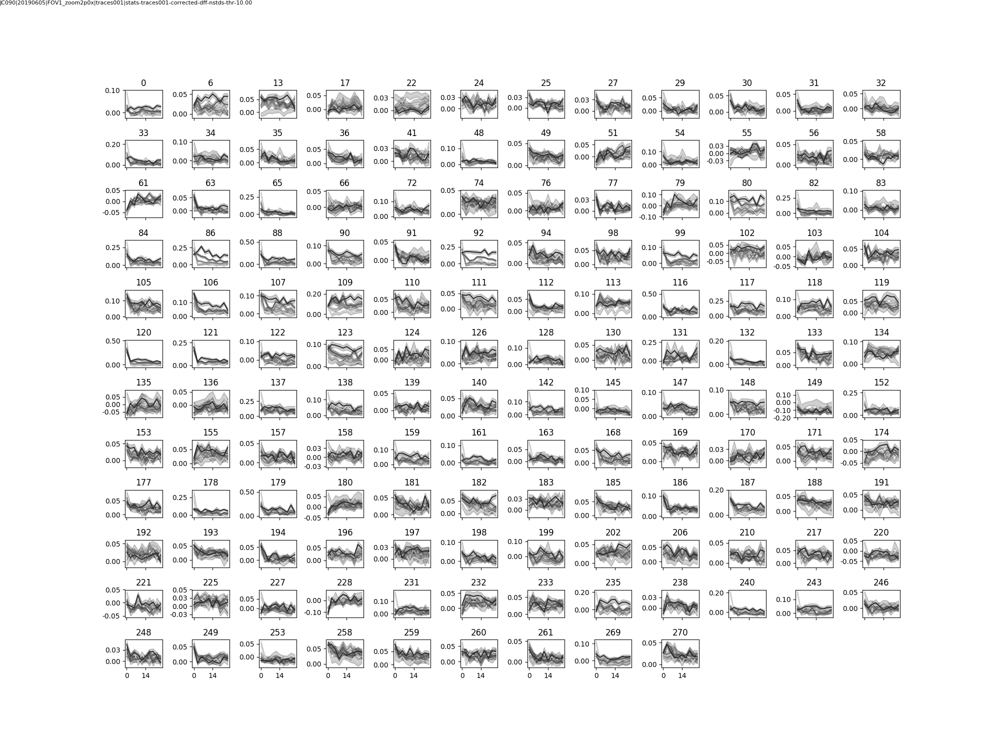

In [51]:

fig = plot_roi_tuning(df_mean, df_sem=df_sem, tune_values=tune_values, tune_name=tune_name,
                     hue_values=hue_values, hue_name=hue_name, hue_colors=hcolors)
if threshold_dff:
    figname = '%s-tuning_%s__%s_thr-dff-%.2f_%irois' % (tune_name, visual_area, data_id.replace('|', '_'), min_dff, len(rois_plot))
else:
    figname = '%s-tuning_%s__%s_all-resp_%irois' % (tune_namevisual_area, data_id.replace('|', '_'), len(rois_plot))


In [60]:
data_id

'JC076|20190422|FOV1_zoom2p0x|traces001|stats-traces001-corrected-dff-nstds-thr-10.00'

In [61]:
len(glob.glob(os.path.join(outdir, 'sessions', 'morph-tuning_%s__%s*.png' % (visual_area, data_id.replace('|', '_')))))

1

... [JC076|20190422|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
... renaming experiment to run name: combined_blobs_static
Getting stimulus info for: combined_blobs_static
... [JC076|20190502|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
... renaming experiment to run name: combined_blobs_static
Getting stimulus info for: combined_blobs_static
... [JC090|20190605|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
... renaming experiment to run name: combined_blobs_static
Getting stimulus info for: combined_blobs_static
... [JC091|20190602|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
... renaming experiment to run name: combined_blobs_static
Getting stimulus info for: combined_blobs_static
... [JC091|20190606|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
... renaming experiment to run name: combined_blobs_static
Getting stimulus info for: combined_blo

<IPython.core.display.Javascript object>


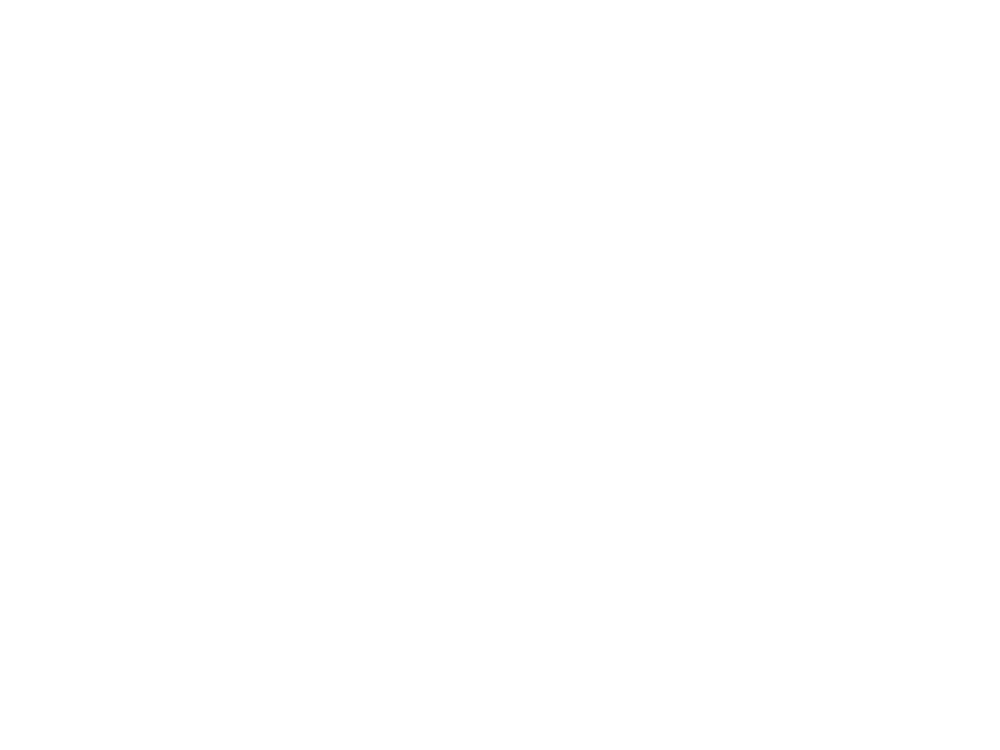

morph-tuning_Lm__JC078_20190430_FOV1_zoom2p0x_traces001_stats-traces001-corrected-dff-nstds-thr-10.00_thr-dff-0.03_152-of-185rois
... [JC078|20190504|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
... renaming experiment to run name: combined_blobs_static
Getting stimulus info for: combined_blobs_static
... loading ROI stats: nstds
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
... offset: 368.74
... updating self
filtering responsive cells: nstds
... getting responsive cells (test: nstds, thr: 10.00')
Plotting 155 of 188 responsive cells.
N rois to plot: 155
(12, 13)


<IPython.core.display.Javascript object>


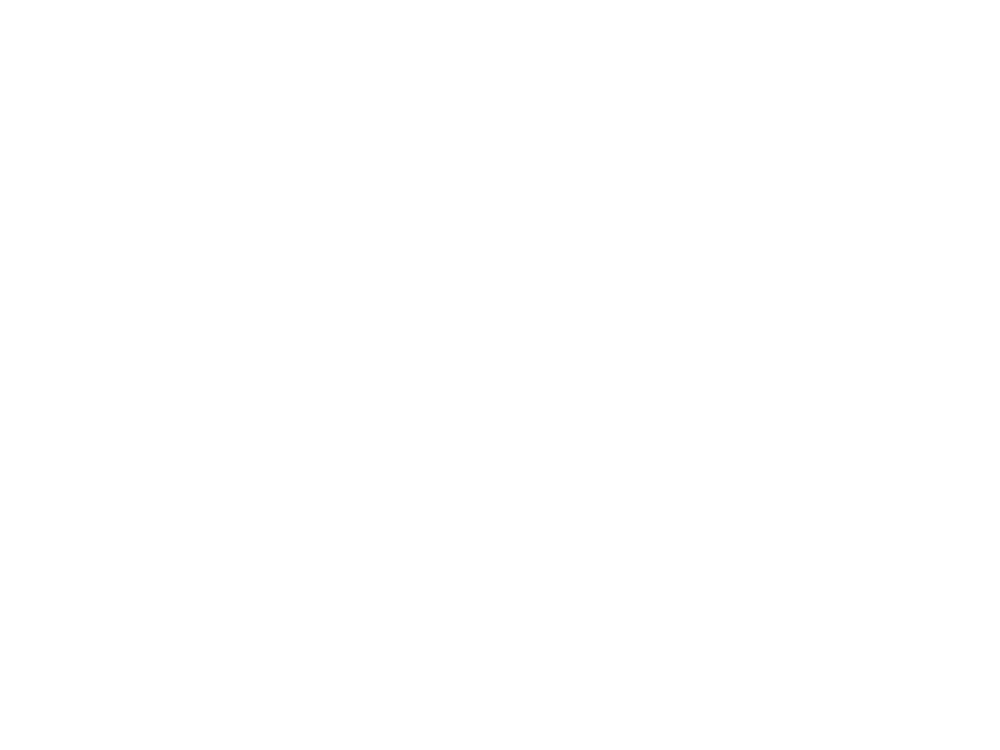

morph-tuning_Lm__JC078_20190504_FOV1_zoom2p0x_traces001_stats-traces001-corrected-dff-nstds-thr-10.00_thr-dff-0.03_155-of-188rois
... [JC078|20190509|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
... renaming experiment to run name: combined_blobs_static
Getting stimulus info for: combined_blobs_static
... loading ROI stats: nstds
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
... offset: 329.04
... updating self
filtering responsive cells: nstds
... getting responsive cells (test: nstds, thr: 10.00')
Plotting 123 of 165 responsive cells.
N rois to plot: 123
(11, 12)


<IPython.core.display.Javascript object>


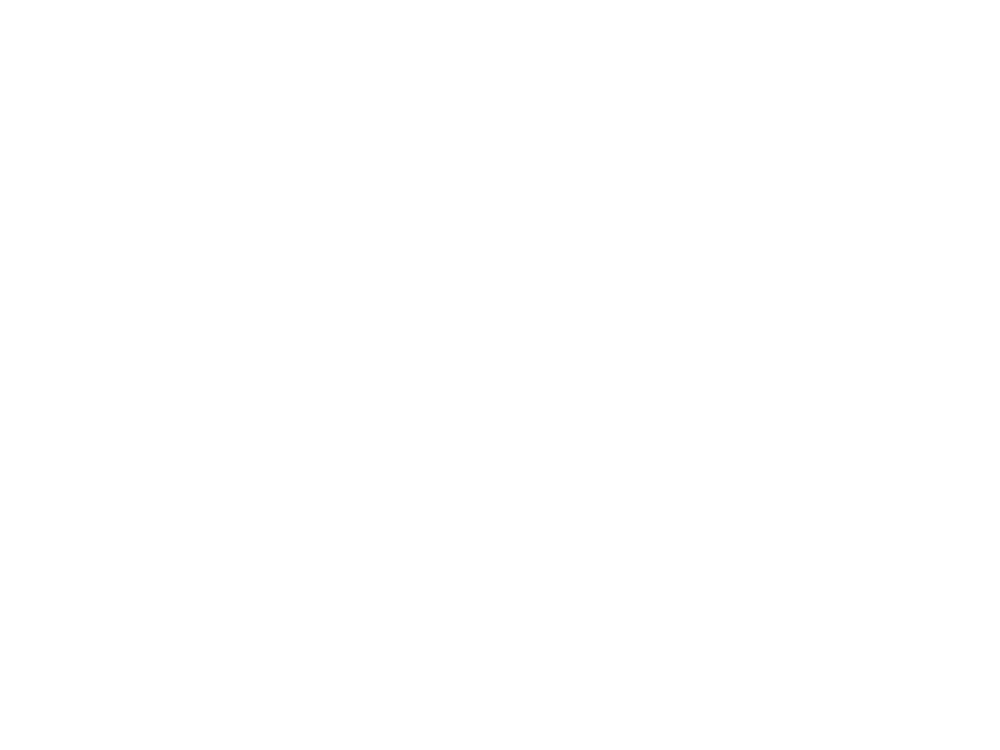

morph-tuning_Lm__JC078_20190509_FOV1_zoom2p0x_traces001_stats-traces001-corrected-dff-nstds-thr-10.00_thr-dff-0.03_123-of-165rois
... [JC078|20190513|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
... renaming experiment to run name: combined_blobs_static
Getting stimulus info for: combined_blobs_static
... loading ROI stats: nstds
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
... offset: 422.91
... adjusting for equal reps / condn...
... updating self
filtering responsive cells: nstds
... getting responsive cells (test: nstds, thr: 10.00')
Plotting 138 of 177 responsive cells.
N rois to plot: 138
(12, 12)


<IPython.core.display.Javascript object>


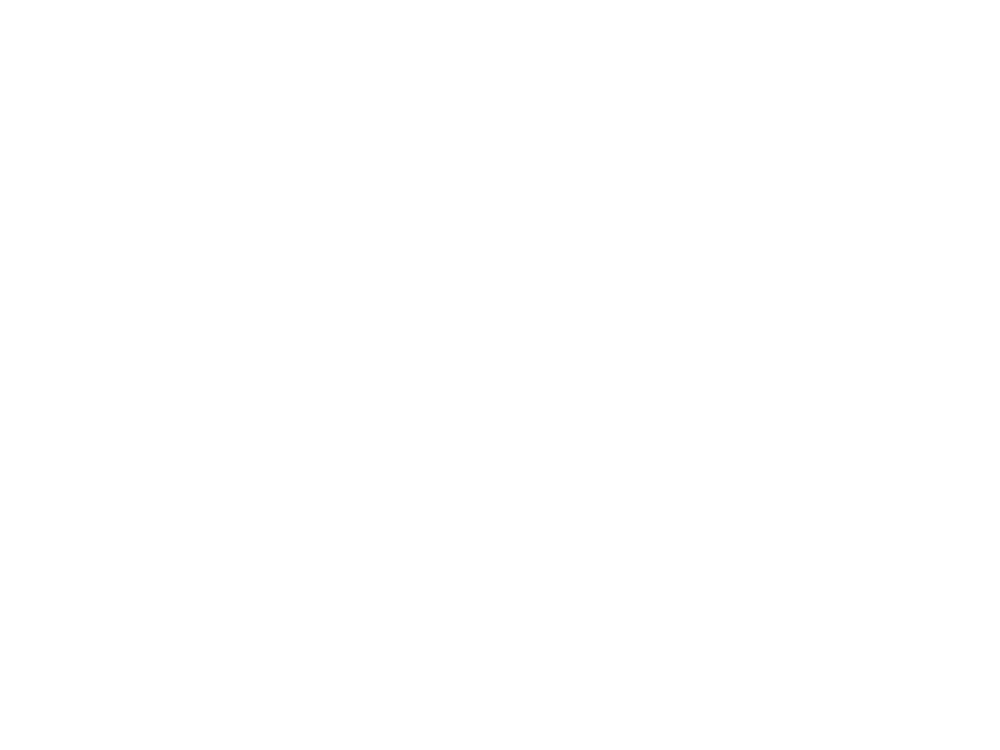

morph-tuning_Lm__JC078_20190513_FOV1_zoom2p0x_traces001_stats-traces001-corrected-dff-nstds-thr-10.00_thr-dff-0.03_138-of-177rois
... [JC080|20190506|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
... renaming experiment to run name: combined_blobs_static
Getting stimulus info for: combined_blobs_static
... loading ROI stats: nstds
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
... offset: 423.89
... updating self
filtering responsive cells: nstds
... getting responsive cells (test: nstds, thr: 10.00')
Plotting 196 of 225 responsive cells.
N rois to plot: 196
(14, 14)


<IPython.core.display.Javascript object>


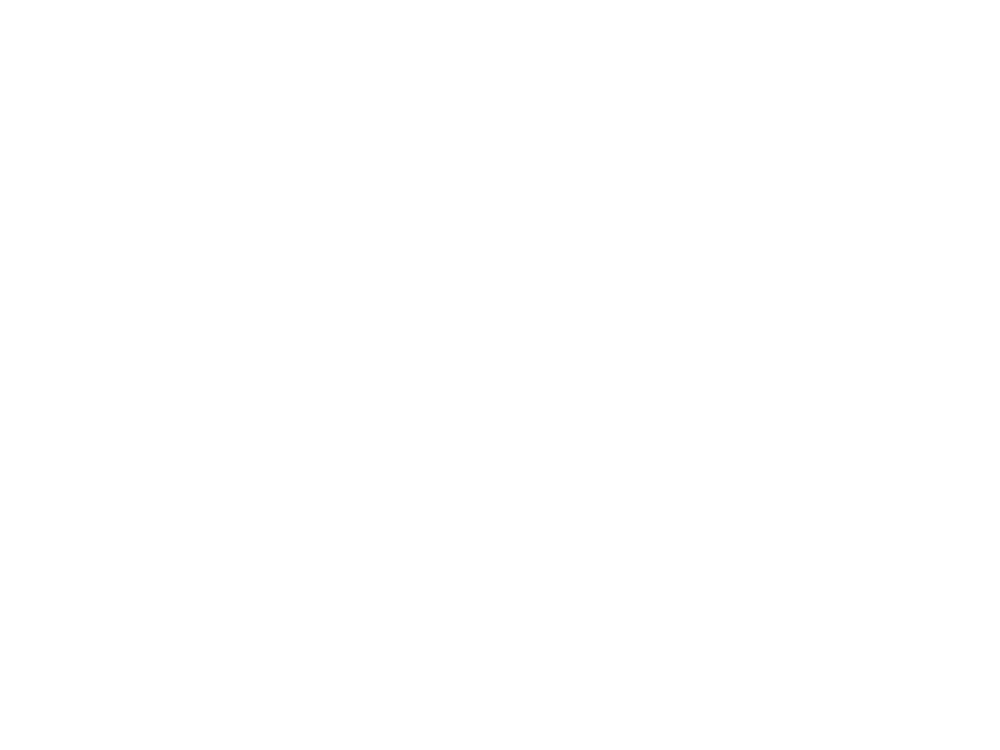

morph-tuning_Lm__JC080_20190506_FOV1_zoom2p0x_traces001_stats-traces001-corrected-dff-nstds-thr-10.00_thr-dff-0.03_196-of-225rois
... [JC080|20190603|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
... renaming experiment to run name: combined_blobs_static
Getting stimulus info for: combined_blobs_static
... loading ROI stats: nstds
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
... offset: 573.12
... updating self
filtering responsive cells: nstds
... getting responsive cells (test: nstds, thr: 10.00')
Plotting 167 of 226 responsive cells.
N rois to plot: 167
(13, 13)


<IPython.core.display.Javascript object>


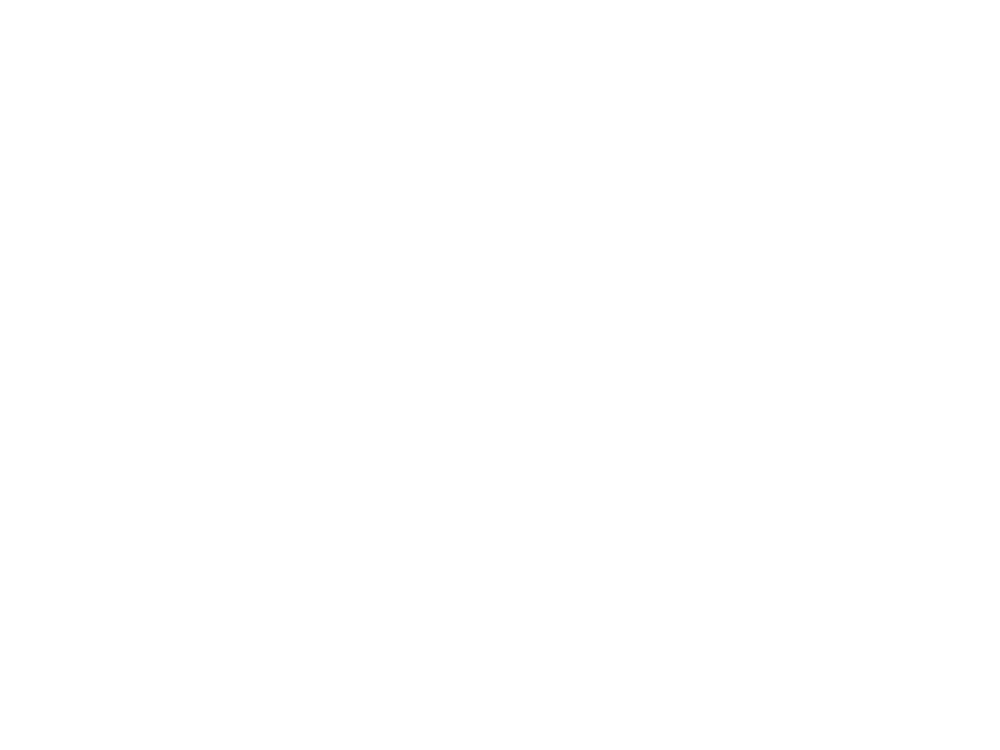

morph-tuning_Lm__JC080_20190603_FOV1_zoom2p0x_traces001_stats-traces001-corrected-dff-nstds-thr-10.00_thr-dff-0.03_167-of-226rois
... [JC083|20190508|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
... renaming experiment to run name: combined_blobs_static
Getting stimulus info for: combined_blobs_static
... loading ROI stats: nstds
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
... offset: 516.48
... adjusting for equal reps / condn...
... updating self
filtering responsive cells: nstds
... getting responsive cells (test: nstds, thr: 10.00')
Plotting 129 of 171 responsive cells.
N rois to plot: 129
(11, 12)


<IPython.core.display.Javascript object>


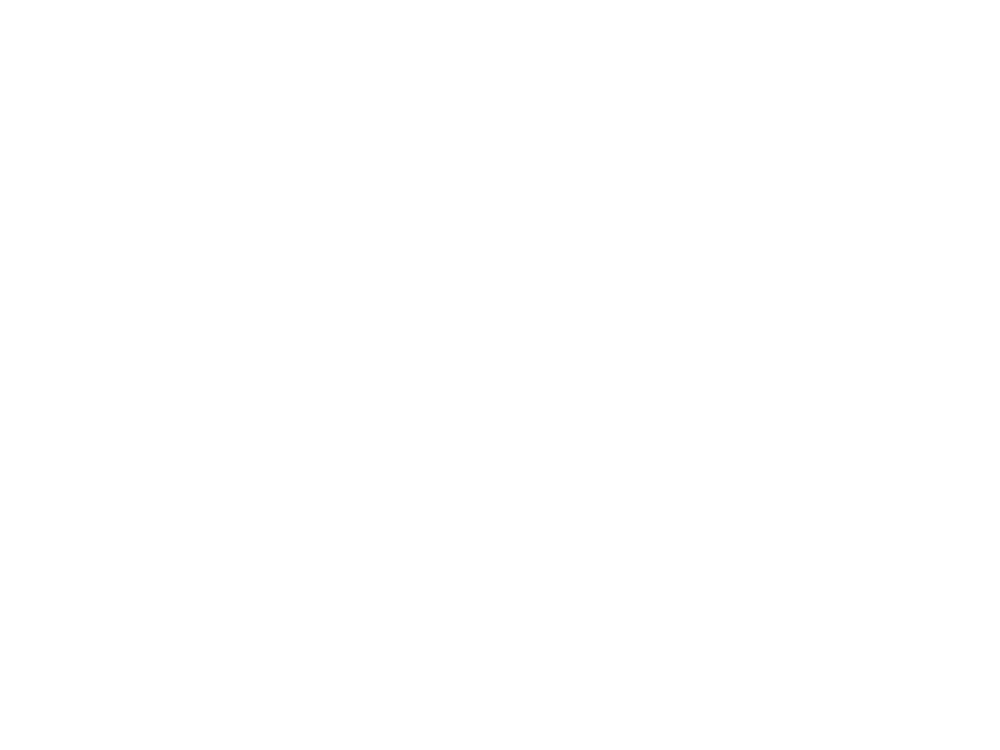

morph-tuning_Lm__JC083_20190508_FOV1_zoom2p0x_traces001_stats-traces001-corrected-dff-nstds-thr-10.00_thr-dff-0.03_129-of-171rois
... [JC083|20190512|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
... renaming experiment to run name: combined_blobs_static
Getting stimulus info for: combined_blobs_static
... loading ROI stats: nstds
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
... offset: 582.17
... adjusting for equal reps / condn...
... updating self
filtering responsive cells: nstds
... getting responsive cells (test: nstds, thr: 10.00')
Plotting 142 of 266 responsive cells.
N rois to plot: 142
(12, 12)


<IPython.core.display.Javascript object>


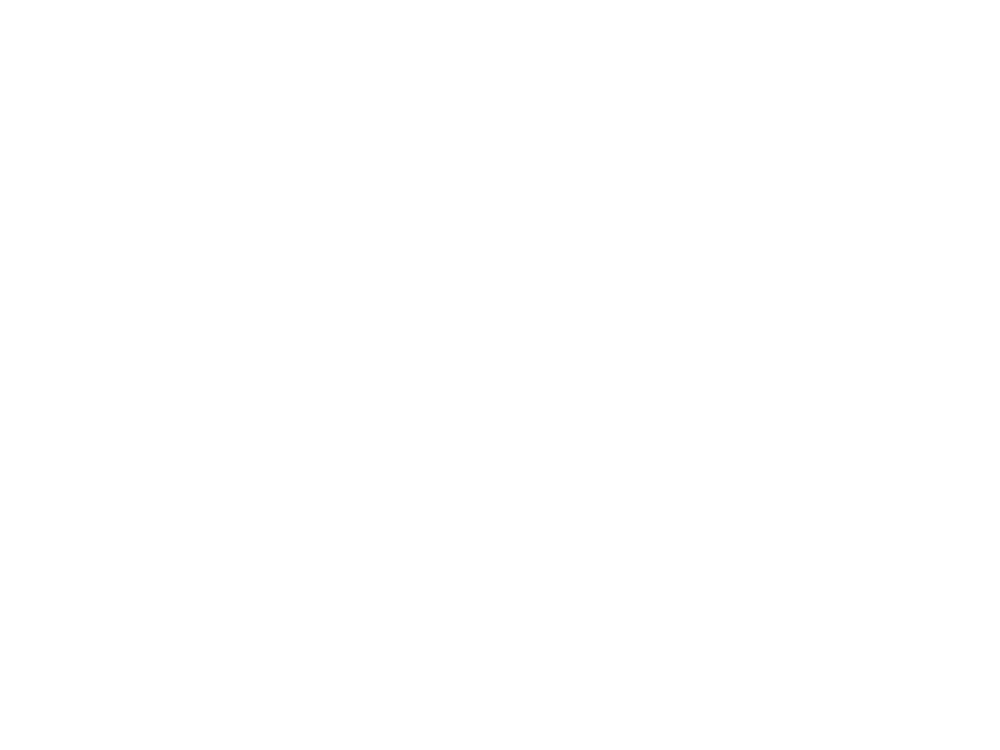

morph-tuning_Lm__JC083_20190512_FOV1_zoom2p0x_traces001_stats-traces001-corrected-dff-nstds-thr-10.00_thr-dff-0.03_142-of-266rois
... [JC083|20190517|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
... renaming experiment to run name: combined_blobs_static
Getting stimulus info for: combined_blobs_static
... loading ROI stats: nstds
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
... offset: 501.39
... updating self
filtering responsive cells: nstds
... getting responsive cells (test: nstds, thr: 10.00')
Plotting 111 of 133 responsive cells.
N rois to plot: 111
(11, 11)


<IPython.core.display.Javascript object>


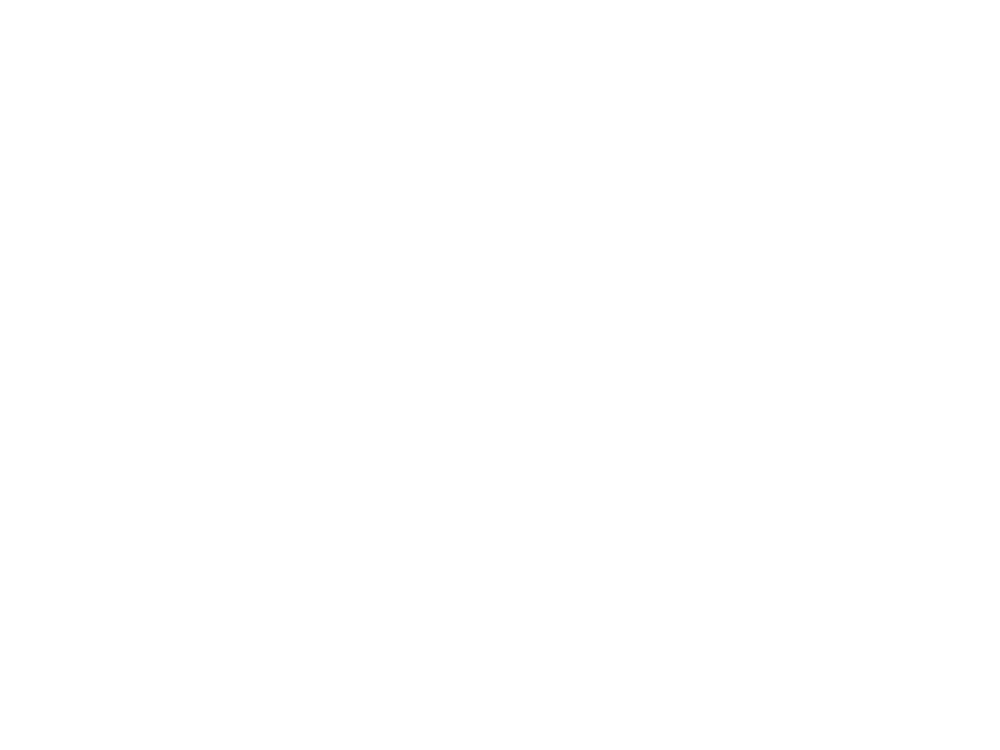

morph-tuning_Lm__JC083_20190517_FOV1_zoom2p0x_traces001_stats-traces001-corrected-dff-nstds-thr-10.00_thr-dff-0.03_111-of-133rois
... [JC084|20190525|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
... renaming experiment to run name: combined_blobs_static
Getting stimulus info for: combined_blobs_static
... loading ROI stats: nstds
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
... offset: 289.08
... updating self
filtering responsive cells: nstds
... getting responsive cells (test: nstds, thr: 10.00')
Plotting 143 of 160 responsive cells.
N rois to plot: 143
(12, 12)


<IPython.core.display.Javascript object>


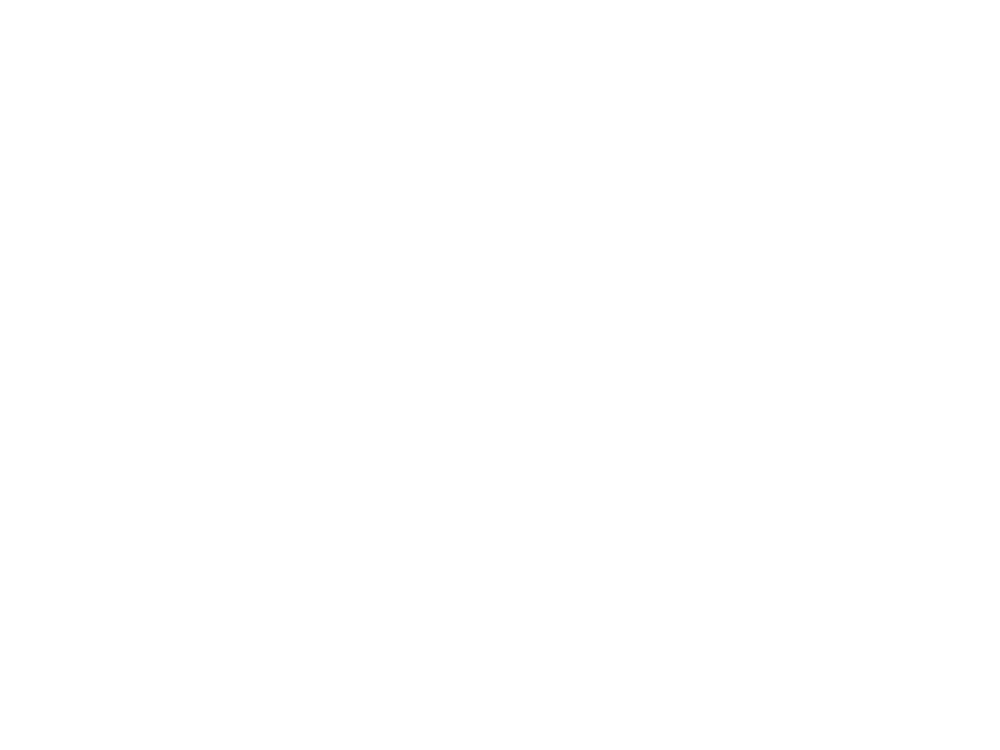

morph-tuning_Lm__JC084_20190525_FOV1_zoom2p0x_traces001_stats-traces001-corrected-dff-nstds-thr-10.00_thr-dff-0.03_143-of-160rois
... [JC091|20190627|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
... renaming experiment to run name: combined_blobs_static
Getting stimulus info for: combined_blobs_static
... loading ROI stats: nstds
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
... offset: 363.42
... updating self
filtering responsive cells: nstds
... getting responsive cells (test: nstds, thr: 10.00')
Plotting 155 of 170 responsive cells.
N rois to plot: 155
(12, 13)


<IPython.core.display.Javascript object>


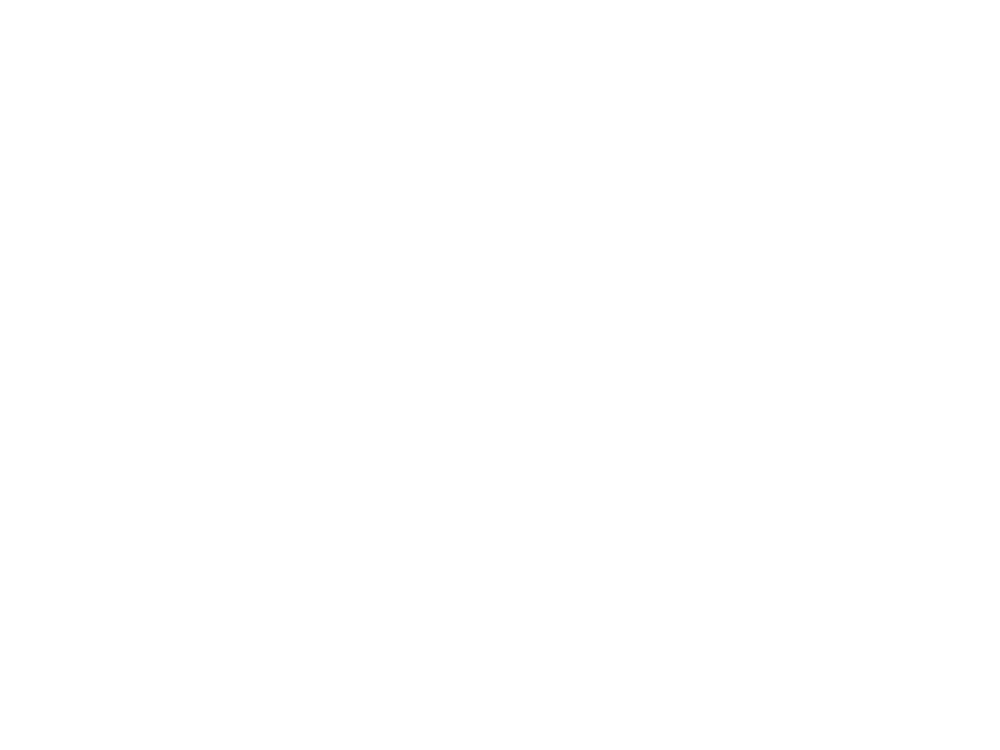

morph-tuning_Lm__JC091_20190627_FOV1_zoom2p0x_traces001_stats-traces001-corrected-dff-nstds-thr-10.00_thr-dff-0.03_155-of-170rois
... [JC076|20190420|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
... renaming experiment to run name: combined_blobs_static
Getting stimulus info for: combined_blobs_static
... loading ROI stats: nstds
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
... offset: 253.29
... updating self
filtering responsive cells: nstds
... getting responsive cells (test: nstds, thr: 10.00')
Plotting 138 of 175 responsive cells.
N rois to plot: 138
(12, 12)


<IPython.core.display.Javascript object>


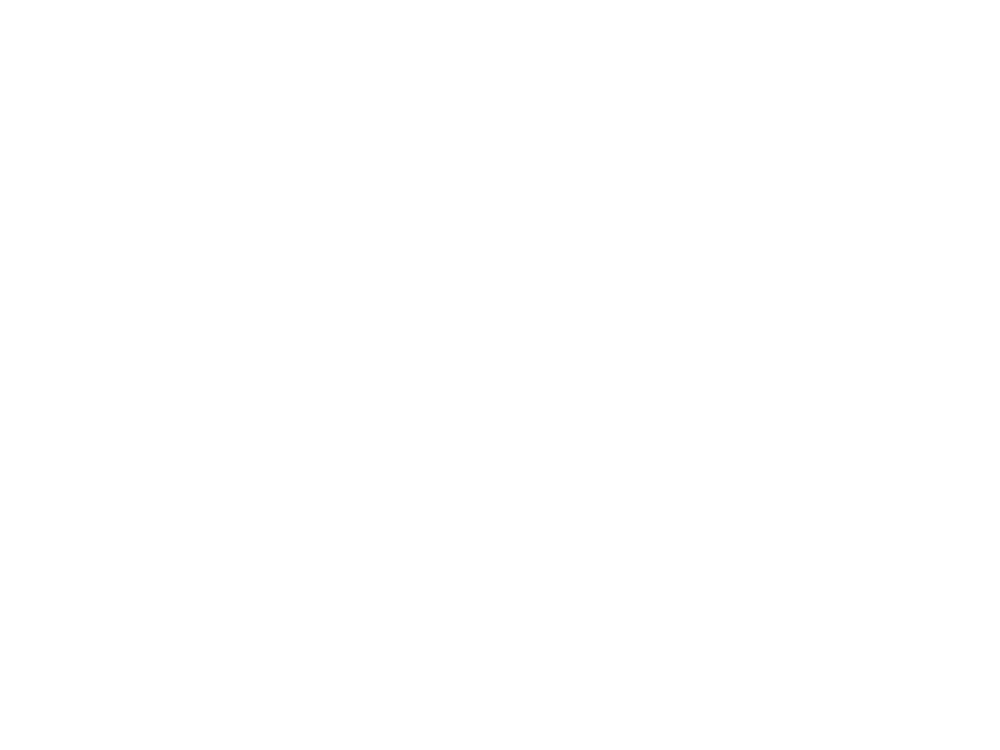

morph-tuning_V1__JC076_20190420_FOV1_zoom2p0x_traces001_stats-traces001-corrected-dff-nstds-thr-10.00_thr-dff-0.03_138-of-175rois
... [JC076|20190501|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
... renaming experiment to run name: combined_blobs_static
Getting stimulus info for: combined_blobs_static
... loading ROI stats: nstds
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
... offset: 285.69
... updating self
filtering responsive cells: nstds
... getting responsive cells (test: nstds, thr: 10.00')
Plotting 156 of 189 responsive cells.
N rois to plot: 156
(12, 13)


<IPython.core.display.Javascript object>


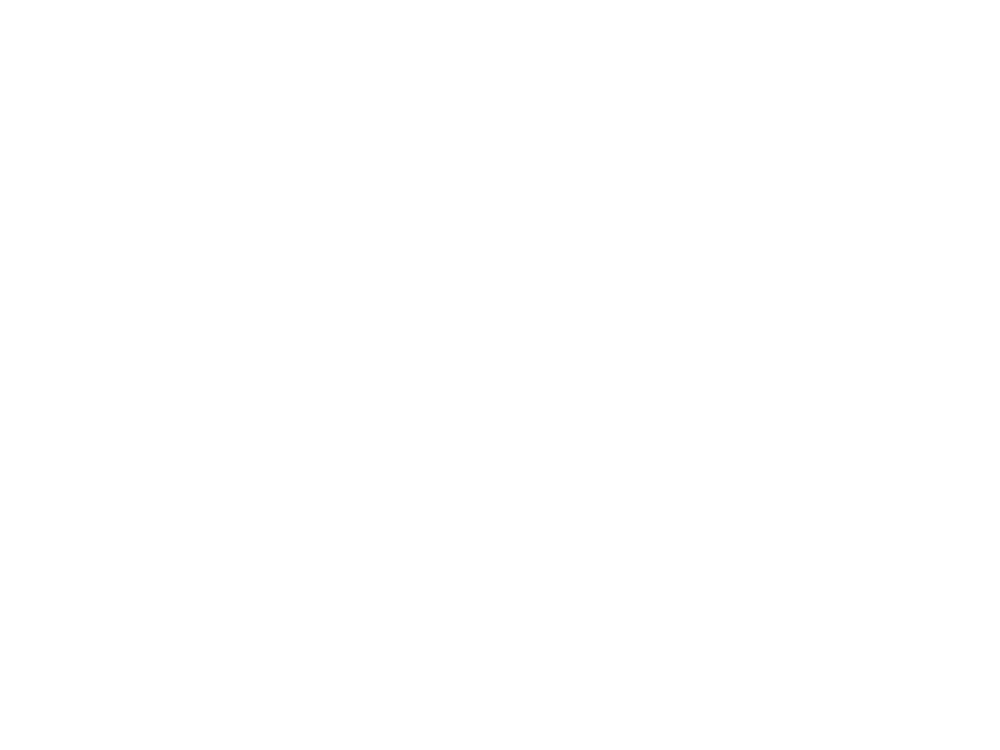

morph-tuning_V1__JC076_20190501_FOV1_zoom2p0x_traces001_stats-traces001-corrected-dff-nstds-thr-10.00_thr-dff-0.03_156-of-189rois
... [JC083|20190507|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
... renaming experiment to run name: combined_blobs_static
Getting stimulus info for: combined_blobs_static
... loading ROI stats: nstds
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
... offset: 297.28
... updating self
filtering responsive cells: nstds
... getting responsive cells (test: nstds, thr: 10.00')
Plotting 119 of 132 responsive cells.
N rois to plot: 119
(11, 11)


<IPython.core.display.Javascript object>


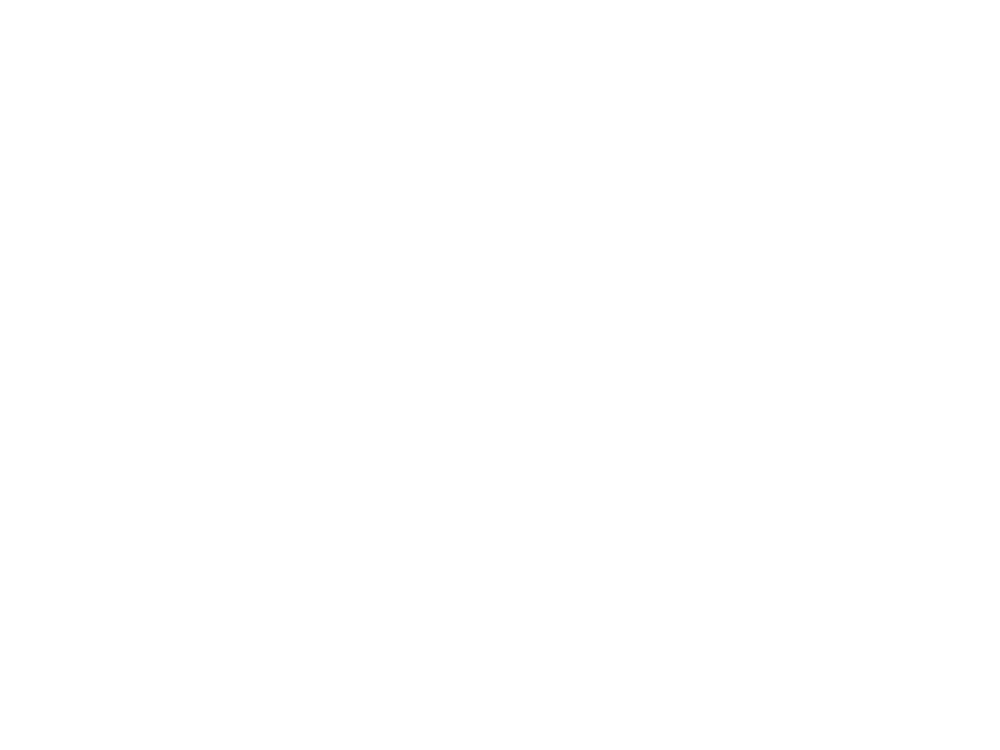

morph-tuning_V1__JC083_20190507_FOV1_zoom2p0x_traces001_stats-traces001-corrected-dff-nstds-thr-10.00_thr-dff-0.03_119-of-132rois
... [JC083|20190510|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
... renaming experiment to run name: combined_blobs_static
Getting stimulus info for: combined_blobs_static
... loading ROI stats: nstds
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
... offset: 310.52
... updating self
filtering responsive cells: nstds
... getting responsive cells (test: nstds, thr: 10.00')
Plotting 100 of 121 responsive cells.
N rois to plot: 100
(10, 10)


<IPython.core.display.Javascript object>


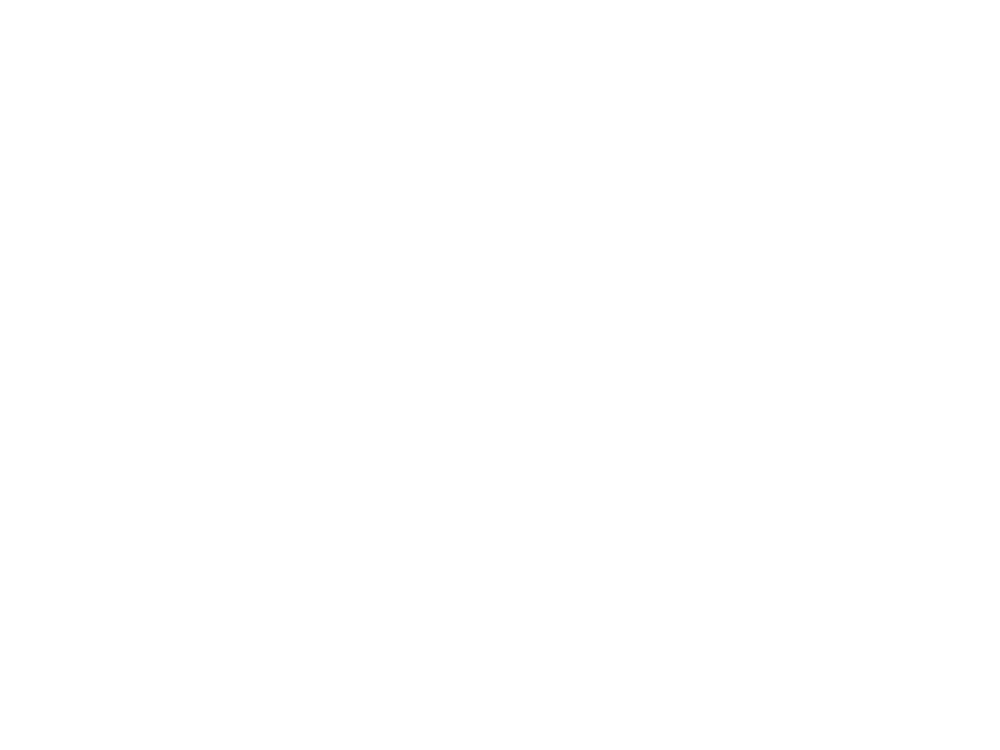

morph-tuning_V1__JC083_20190510_FOV1_zoom2p0x_traces001_stats-traces001-corrected-dff-nstds-thr-10.00_thr-dff-0.03_100-of-121rois
... [JC083|20190511|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
... renaming experiment to run name: combined_blobs_static
Getting stimulus info for: combined_blobs_static
... loading ROI stats: nstds
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
... offset: 327.49
... updating self
filtering responsive cells: nstds
... getting responsive cells (test: nstds, thr: 10.00')
Plotting 120 of 126 responsive cells.
N rois to plot: 120
(11, 11)


<IPython.core.display.Javascript object>


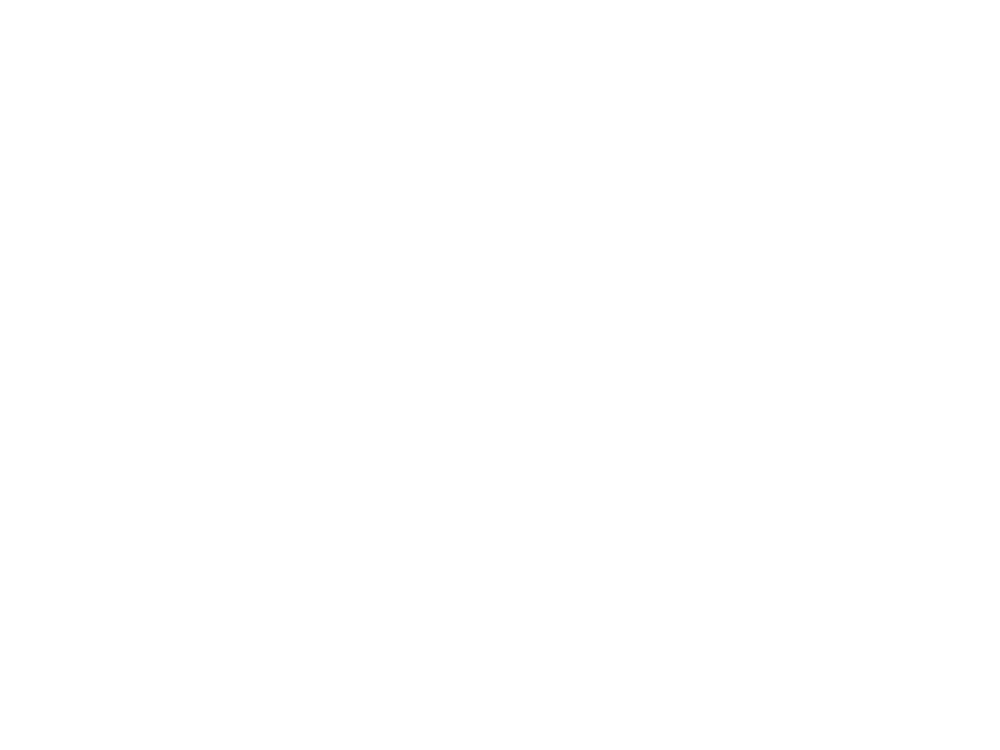

morph-tuning_V1__JC083_20190511_FOV1_zoom2p0x_traces001_stats-traces001-corrected-dff-nstds-thr-10.00_thr-dff-0.03_120-of-126rois
... [JC084|20190522|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
... renaming experiment to run name: combined_blobs_static
Getting stimulus info for: combined_blobs_static
... loading ROI stats: nstds
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
... offset: 608.72
... updating self
filtering responsive cells: nstds
... getting responsive cells (test: nstds, thr: 10.00')
Plotting 128 of 180 responsive cells.
N rois to plot: 128
(11, 12)


<IPython.core.display.Javascript object>


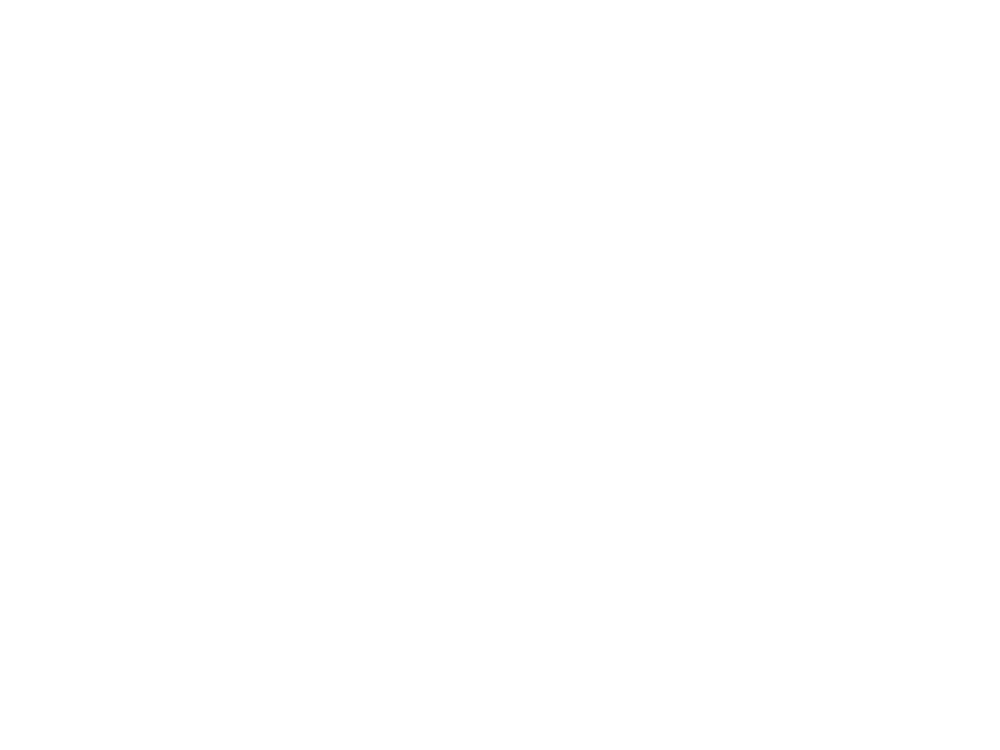

morph-tuning_V1__JC084_20190522_FOV1_zoom2p0x_traces001_stats-traces001-corrected-dff-nstds-thr-10.00_thr-dff-0.03_128-of-180rois
... [JC085|20190622|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
... renaming experiment to run name: combined_blobs_static
Getting stimulus info for: combined_blobs_static
... loading ROI stats: nstds
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
... offset: 370.88
... updating self
filtering responsive cells: nstds
... getting responsive cells (test: nstds, thr: 10.00')
Plotting 185 of 202 responsive cells.
N rois to plot: 185
(14, 14)


<IPython.core.display.Javascript object>


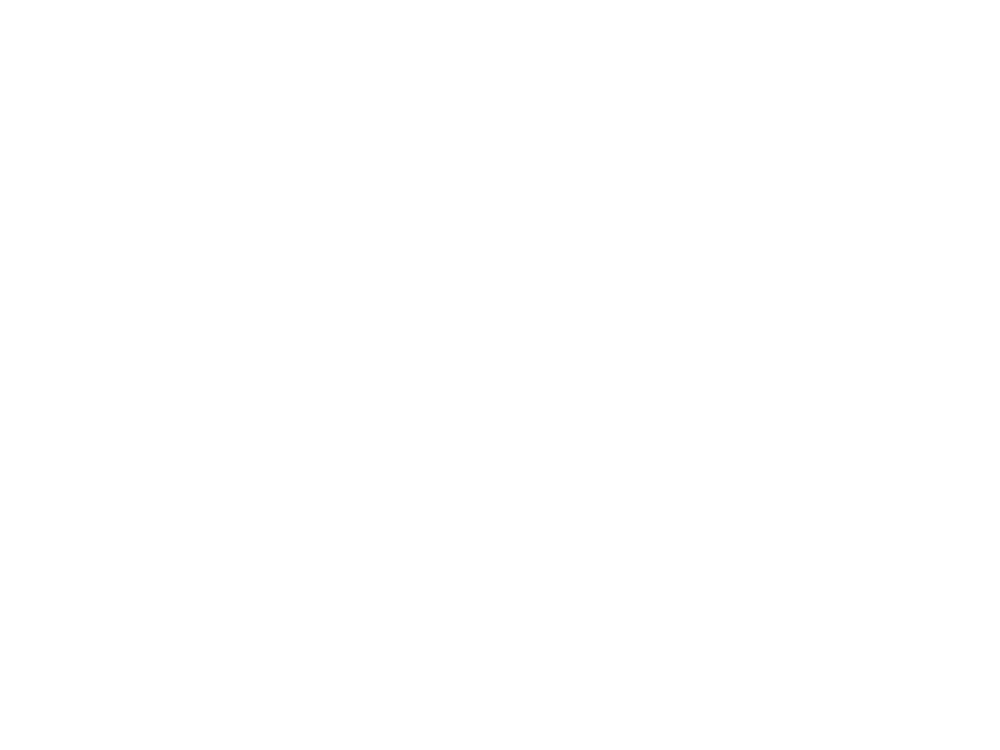

morph-tuning_V1__JC085_20190622_FOV1_zoom2p0x_traces001_stats-traces001-corrected-dff-nstds-thr-10.00_thr-dff-0.03_185-of-202rois
... [JC097|20190613|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
... renaming experiment to run name: combined_blobs_static
Getting stimulus info for: combined_blobs_static
... loading ROI stats: nstds
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
... offset: 634.92
... updating self
filtering responsive cells: nstds
... getting responsive cells (test: nstds, thr: 10.00')
Plotting 125 of 166 responsive cells.
N rois to plot: 125
(11, 12)


<IPython.core.display.Javascript object>


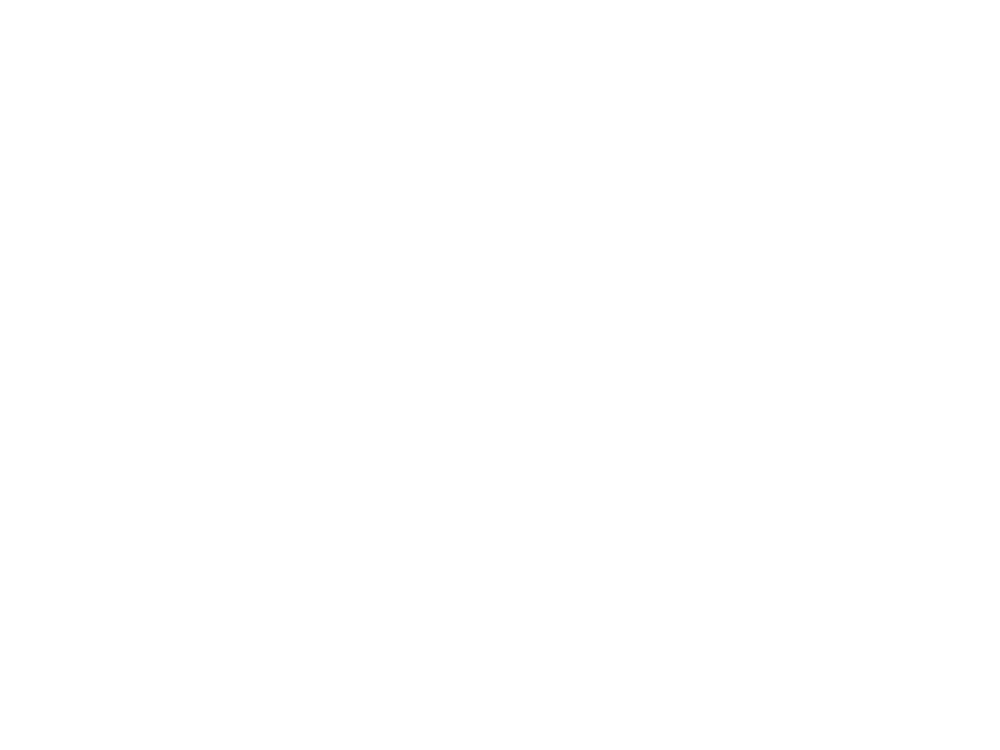

morph-tuning_V1__JC097_20190613_FOV1_zoom2p0x_traces001_stats-traces001-corrected-dff-nstds-thr-10.00_thr-dff-0.03_125-of-166rois
... [JC097|20190616|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
... renaming experiment to run name: combined_blobs_static
Getting stimulus info for: combined_blobs_static
... loading ROI stats: nstds
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
... offset: 692.01
... updating self
filtering responsive cells: nstds
... getting responsive cells (test: nstds, thr: 10.00')
Plotting 237 of 298 responsive cells.
N rois to plot: 237
(15, 16)


<IPython.core.display.Javascript object>


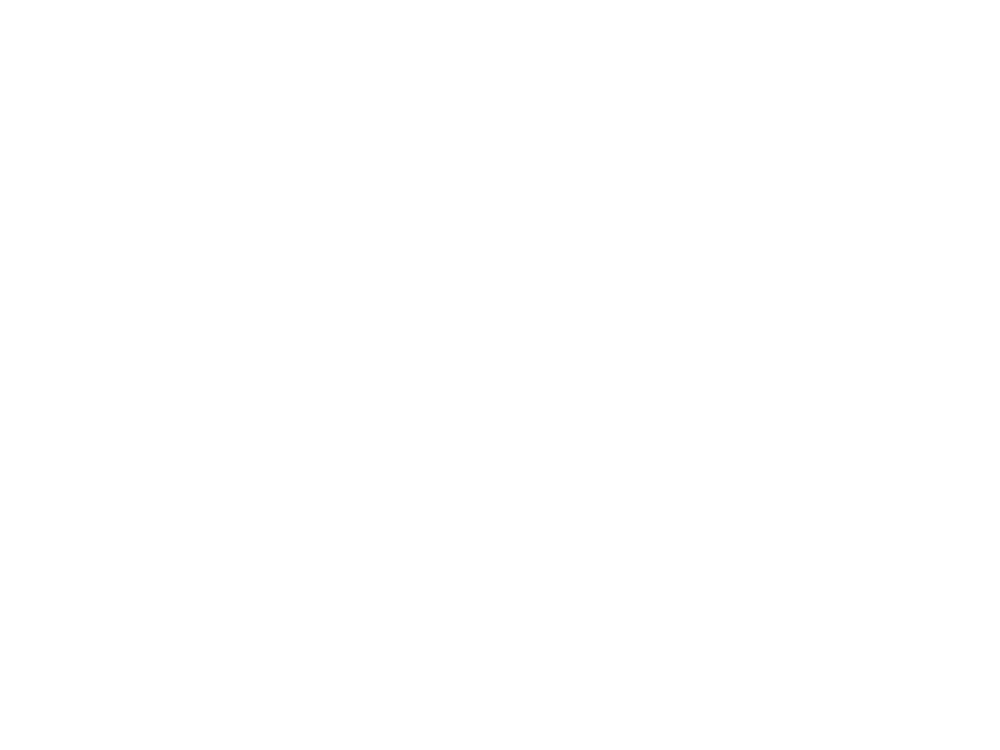

morph-tuning_V1__JC097_20190616_FOV1_zoom2p0x_traces001_stats-traces001-corrected-dff-nstds-thr-10.00_thr-dff-0.03_237-of-298rois
... [JC097|20190617|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
... renaming experiment to run name: combined_blobs_static
Getting stimulus info for: combined_blobs_static
... loading ROI stats: nstds
... [combined_blobs_static] Loading roi stats and cell list...
... loading data array
... offset: 617.18
... adjusting for equal reps / condn...
... updating self
filtering responsive cells: nstds
... getting responsive cells (test: nstds, thr: 10.00')
Plotting 231 of 276 responsive cells.
N rois to plot: 231
(15, 16)


<IPython.core.display.Javascript object>


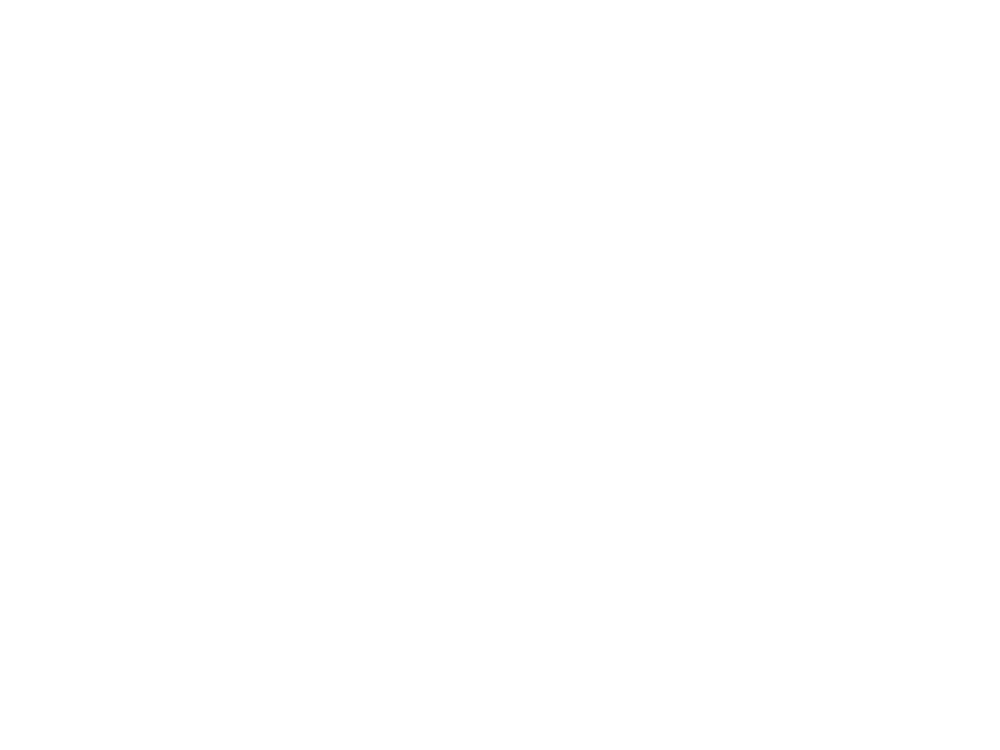

morph-tuning_V1__JC097_20190617_FOV1_zoom2p0x_traces001_stats-traces001-corrected-dff-nstds-thr-10.00_thr-dff-0.03_231-of-276rois


In [62]:
for (visual_area, animalid, session, fov), g in dsets.groupby(['visual_area', 'animalid', 'session', 'fov']):
    data_id = '|'.join([animalid, session, fov, traceid, stats_desc])

    skey = '-'.join([visual_area, animalid, session, fov])
    
    exp = util.Objects(animalid, session, fov, traceid=traceid, rootdir=rootdir)
    # Get stimulus conditions
    sdf = exp.get_stimuli()
    sdf = reformat_morph_values(sdf)
    sizes = np.array(sorted(sdf['size'].unique()))
    morphs = np.array(sorted(sdf['morphlevel'].unique()))

    n_sizes = len(sdf['size'].unique())
    n_morphs = len(sdf['morphlevel'].unique()) 
    if n_sizes != n_sz or n_morphs != n_mp:
        incorrect_nvalues.append(skey)
        continue
        
    figexists = len(glob.glob(os.path.join(outdir, 'sessions', 'morph-tuning_%s__%s*.png' % (visual_area, data_id.replace('|', '_')))))
    
    if figexists:
        continue
    

    rstats, rlist, _ = util.get_roi_stats(animalid, session, fov, exp_name=exp.name,
                                 response_type=response_type, responsive_test=responsive_test,
                                 responsive_thr=responsive_thr, n_stds=n_stds)
    rstats = rstats['nframes_above']
    

    # Get metrics for each condition
    estats = exp.get_stats(responsive_test=responsive_test, responsive_thr=responsive_thr, n_stds=n_stds)
    meanr = pd.concat([pd.Series(estats.gdf.get_group(roi).groupby(['config']).mean()['dff'], name=roi) \
                       for roi in estats.rois], axis=1).T
    assert len(np.where(np.isnan(meanr))[0])==0
    semr = pd.concat([pd.Series(estats.gdf.get_group(roi).groupby(['config']).sem()['dff'], name=roi) \
                       for roi in estats.rois], axis=1).T
    # Get ROI list
    if threshold_dff:
        rois_plot = meanr[(meanr.max(axis=1) > min_dff)].index.tolist()
    else:
        rois_plot = meanr.index.tolist()
    print("Plotting %i of %i responsive cells." % (len(rois_plot), len(meanr.index.tolist())))

    df_mean = meanr.loc[rois_plot]
    df_sem = semr.loc[rois_plot]

    hue_name = 'size' if tune_name=='morph' else 'morph'
    tune_values = morphs.copy() if tune_name=='morph' else sizes.copy()
    hue_values = sizes.copy() if tune_name=='morph' else morphs.copy()
    hcolors = sns.color_palette('gray_r', n_colors=n_sz) if tune_name=='morph' else sns.color_palette('gray_r', n_colors=n_mp) 


    fig = plot_roi_tuning(df_mean, df_sem=df_sem, tune_values=tune_values, tune_name=tune_name,
                         hue_values=hue_values, hue_name=hue_name, hue_colors=hcolors)
    if threshold_dff:
        figname = '%s-tuning_%s__%s_thr-dff-%.2f_%i-of-%irois' % (tune_name, visual_area, data_id.replace('|', '_'), min_dff, len(rois_plot), len(estats.rois))
    else:
        figname = '%s-tuning_%s__%s_all-resp_%i-of-%irois' % (tune_namevisual_area, data_id.replace('|', '_'), len(rois_plot), len(estats.rois))

    pl.savefig(os.path.join(outdir, 'sessions', '%s.png' % figname))
    print figname
    pl.close()
    
    del exp


# Look at counts across visual areas

In [154]:
incorrect_nconfigs = []
incorrect_nvalues = []
nresponsive = {}
ntotal = {}

In [155]:
for (visual_area, animalid, session, fov), g in dsets.groupby(['visual_area', 'animalid', 'session', 'fov']):
    exp = util.Objects(animalid, session, fov, traceid=traceid, rootdir=rootdir)
    skey = '%s-%s-%s' % (animalid, session, fov)

    sdf = exp.get_stimuli()
    if len(sdf.index.tolist()) != 50:
        incorrect_nconfigs.append(skey)
        continue

    control_ixs = sdf[sdf['morphlevel']==-1].index.tolist()
    sizevals = np.array([round(s, 1) for s in sdf['size'].unique() if s not in ['None', None] and not np.isnan(s)] )
    sdf.loc[sdf.morphlevel==-1, 'size'] = pd.Series(sizevals, index=control_ixs)
    sdf['size'] = [round(s, 1) for s in sdf['size'].values]
    n_sizes = len(sdf['size'].unique())
    n_morphs = len(sdf['morphlevel'].unique()) 
    if n_sizes != nr or n_morphs != nc:
        incorrect_nvalues.append(skey)
        continue

    if visual_area not in nresponsive.keys():
        nresponsive[visual_area] = {}
        ntotal[visual_area] = {}
    rstats, rlist, _ = util.get_roi_stats(animalid, session, fov, exp_name=exp.name,
                                 response_type=response_type, responsive_test=responsive_test,
                                 responsive_thr=responsive_thr, n_stds=n_stds)
    rstats = rstats['nframes_above']


    ncells_arr = np.empty((nr, nc), dtype=int)
    for ri, sz in enumerate(sizes):
        for mi, mp in enumerate(morphs):
            assert sz in sdf['size'].unique(), "wrong size: %i" % sz
            assert mp in sdf['morphlevel'].unique(), "wrong morph: %i" % mp
            ax = axes[ri, mi]
            cfg = sdf[( (sdf['size']==sz) & (sdf['morphlevel']==mp) )].index[0]
            ncells_resp = len(np.where(rstats.loc[cfg] >= responsive_thr)[0])
            ncells_arr[ri, mi] = ncells_resp

    nresponsive[visual_area].update({skey: ncells_arr})
    ntotal[visual_area].update({skey: len(rlist)})
    
    
        

... [JC076|20190422|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
... renaming experiment to run name: combined_blobs_static
Getting stimulus info for: combined_blobs_static
... loading ROI stats: nstds
... [JC076|20190502|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
... renaming experiment to run name: combined_blobs_static
Getting stimulus info for: combined_blobs_static
... loading ROI stats: nstds
... [JC090|20190605|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
... renaming experiment to run name: combined_blobs_static
Getting stimulus info for: combined_blobs_static
... loading ROI stats: nstds
... [JC091|20190602|FOV1_zoom2p0x] creating blobs object
... getting data paths - name: blobs
... renaming experiment to run name: combined_blobs_static
Getting stimulus info for: combined_blobs_static
... loading ROI stats: nstds
... [JC091|20190606|FOV1_zoom2p0x] creating blobs object
... getting data pa

In [157]:
print incorrect_nvalues
print incorrect_nconfigs

[]
['JC078-20190426-FOV1_zoom2p0x']


In [192]:
data_identifier = '|'.join(['blobs', fov_type, traceid, stats_desc])
print(data_identifier)

blobs|zoom2p0x|traces001|stats-traces001-corrected-dff-nstds-thr-10.00


<IPython.core.display.Javascript object>


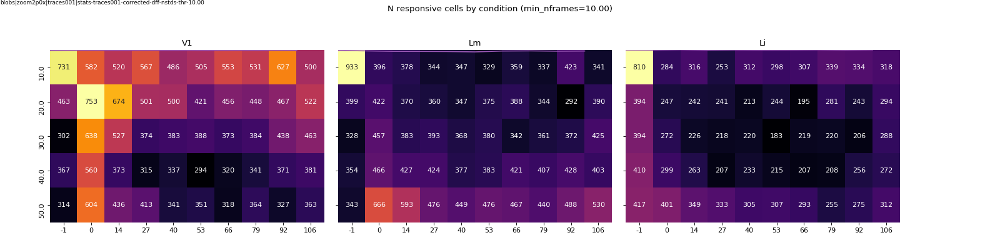

In [210]:
nr=5
nc=10
cmap = 'inferno'
normalize = False

fig, axes = pl.subplots(1,3, sharex=True, sharey=True, figsize=(20, 5))
fig.patch.set_alpha(1)
#vmin = 0
#vmax = 1
for ax, visual_area in zip(axes, ['V1', 'Lm', 'Li']):
    agg_arr = np.empty((nr, nc))
    sessionkeys = sorted(ntotal[visual_area].keys(), key=natural_keys)
    ncells_total = [ntotal[visual_area][k] for k in sessionkeys]
    resp_array = [nresponsive[visual_area][k] for k in sessionkeys]
    for ncells, r_arr in zip(ncells_total, resp_array):
        if normalize:
            agg_arr += (r_arr / float(ncells))
        else:
            agg_arr += r_arr
    
    if normalize:
        agg_arr = agg_arr / float(len(sessionkeys))
        sns.heatmap(agg_arr, ax=ax,cmap=cmap, #square=True, 
                    fmt='.2g', annot=True, cbar=0,
                    vmin=vmin, vmax=vmax)
    else:
        agg_arr = agg_arr.astype(int)
        sns.heatmap(agg_arr, ax=ax,cmap=cmap, #square=True, 
                    fmt='d', annot=True, cbar=0)
        
    ax.set_yticklabels(sizes)
    ax.set_xticklabels(morphs)    
    ax.set_title(visual_area)

if normalize:
    title = 'perc. of responsive cells by condition (min_nframes=%.2f)' % responsive_thr
    figname = 'ncells_responsive_by_condition-%s-thr-%.2f_normalized' % (responsive_test, responsive_thr)

else:
    title = 'N responsive cells by condition (min_nframes=%.2f)' % responsive_thr
    figname = 'ncells_responsive_by_condition-%s-thr-%.2f' % (responsive_test, responsive_thr)

fig.suptitle(title)

pl.subplots_adjust(wspace=0.05, left=0.05, top=0.8)
label_figure(fig, data_identifier)


pl.savefig(os.path.join(outdir, '%s.png' % figname ))


In [190]:
outdir

'/n/coxfs01/julianarhee/aggregate-visual-areas/blob-tuning/stats-traces001-corrected-dff-nstds-thr-10.00'

#### Look at num responsive for 1 session

In [ ]:
animalid = 'JC084'
session = '20190522'
fov = 'FOV1_zoom2p0x'


In [101]:
exp = util.Objects(animalid, session, fov, traceid=traceid, rootdir=rootdir)

rstats, _, _ = util.get_roi_stats(animalid, session, fov, exp_name=exp.name,
                                 response_type=response_type, responsive_test=responsive_test,
                                 responsive_thr=responsive_thr, n_stds=n_stds)
rstats = rstats['nframes_above']

... loading ROI stats: nstds


In [226]:
sdf = exp.get_stimuli()
sdf = reformat_morph_values(sdf)
sizes = sorted(sdf['size'].unique())
morphs = sorted(sdf['morphlevel'].unique())

Getting stimulus info for: combined_blobs_static


In [228]:

nr = len(sizes)
nc = len(morphs)

ncells_arr = np.empty((nr, nc), dtype=int)
#fig, axes = pl.subplots(nr, nc, sharex=True, sharey=True)
#cbar_ax = fig.add_axes([.91, .3, .03, .4])
#i  = 0
for ri, sz in enumerate(sizes):
    for mi, mp in enumerate(morphs):
        cfg = sdf[( (sdf['size']==sz) & (sdf['morphlevel']==mp) )].index[0]
        ncells_resp = len(np.where(rstats.loc[cfg] >= responsive_thr)[0])
        ncells_arr[ri, mi] = ncells_resp
        

<IPython.core.display.Javascript object>


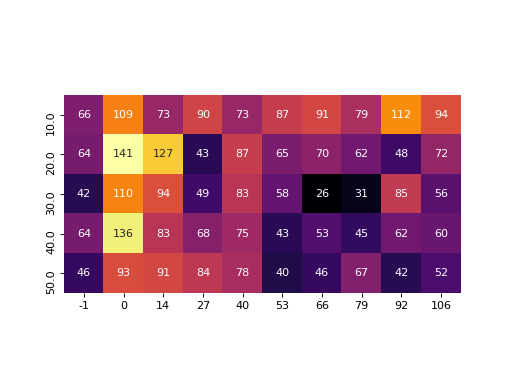

[Text(0.5,0,u'-1'),
 Text(1.5,0,u'0'),
 Text(2.5,0,u'14'),
 Text(3.5,0,u'27'),
 Text(4.5,0,u'40'),
 Text(5.5,0,u'53'),
 Text(6.5,0,u'66'),
 Text(7.5,0,u'79'),
 Text(8.5,0,u'92'),
 Text(9.5,0,u'106')]

In [229]:
fig, ax  = pl.subplots()
sns.heatmap(ncells_arr, ax=ax,cmap=cmap, square=True, fmt='d', annot=True, cbar=0)
ax.set_yticklabels(sizes)
ax.set_xticklabels(morphs)